<a href="https://colab.research.google.com/github/Murcha1990/ML_AI25/blob/main/Hometasks/Pro/AI_HW1_Regression_with_inference_pro.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Домашнее задание №1 (pro). Часть 1**

В этом домашнем задании (его первой части) вам будет необходимо:
*  обучить модель регрессии для предсказания стоимости автомобилей;


> Оценка за первую часть домашки = $min(\text{ваш балл}, 7)$



**Примечание**

В каждой части оцениваются как код, **так и ответы на вопросы.** Вопросы подсвечены синим цветом.

Если нет одного и/или другого, то часть баллов за соответствующее задание снимается.

In [1]:
!pip install ydata_profiling phik


[notice] A new release of pip is available: 24.3.1 -> 25.3
[notice] To update, run: pip install --upgrade pip


In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import random
import seaborn as sns
import re
import warnings
import phik

from ydata_profiling import ProfileReport
from IPython.display import display

from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Lasso
from sklearn.metrics import r2_score, mean_squared_error as MSE
from sklearn.linear_model import Ridge
from sklearn.model_selection import GridSearchCV
from sklearn.compose import ColumnTransformer

from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import ElasticNet
from sklearn.pipeline import Pipeline
from sklearn.feature_selection import SelectFromModel
from sklearn.preprocessing import PolynomialFeatures
from sklearn.metrics import make_scorer

warnings.filterwarnings('ignore')

random.seed(42)
np.random.seed(42)

### Функции помощники

In [3]:
# Функция очистки, убираем строки, если падает ошибка выдаем None
def remove_units(value, number_type, regexp=r'[^\d.]'):
    try:
        new_value = re.sub(regexp, '', f'{value}')

        return number_type(new_value)
    except:
        return None


# Нормализация записи torque, идет предварительная обработка строки, дальше смотрим формат в котором было написано torque 
# и приведение к общему виду с nm и rpm, и уже потом идет обработка и разбивание на 2 столбца, паттерны помогла написать LLM
def parse_torque(value_torque):
    if pd.isna(value_torque) or value_torque == '':
        return np.nan, np.nan

    value_torque = str(value_torque).lower().strip()
    value_torque = re.sub(r'\s+', ' ', value_torque)
    value_torque = value_torque.replace(',', '')

    kgm_rate = 9.80665

    # Каюсь этот формат кода с паттернами regexp был написан вместе с LLM, пришлось скормить .unique чтобы она вернула все 
    # возможные паттерны :(
    patterns = [
        # Формат: 190Nm@2000rpm, 250Nm@1500-2500rpm
        r'(\d+\.?\d*)\s*(nm|kgm)\s*@\s*(\d+)(?:\s*-\s*(\d+))?\s*rpm',
        # Формат: 22.4 kgm at 1750-2750rpm
        r'(\d+\.?\d*)\s*(kgm|nm)\s*at\s*(\d+)(?:\s*-\s*(\d+))?\s*rpm',
        # Формат: 11.5@4500(kgm@rpm), 24@1900-2750(kgm@rpm)
        r'(\d+\.?\d*)\s*@\s*(\d+)(?:\s*-\s*(\d+))?\s*\(\s*(kgm|nm)\s*@\s*rpm\s*\)',
        # Формат: 135 Nm at 2500 rpm (с пробелами)
        r'(\d+\.?\d*)\s*(nm|kgm)\s*at\s*(\d+)(?:\s*-\s*(\d+))?\s*rpm',
        # Формат: 250 Nm at 1500-3000 rpm
        r'(\d+\.?\d*)\s*(nm|kgm)\s*at\s*(\d+)\s*-\s*(\d+)\s*rpm',
        # Формат: 400 Nm /2000 rpm
        r'(\d+\.?\d*)\s*(nm|kgm)\s*/\s*(\d+)\s*rpm',
        # Формат: 510@1600-2400 (без единиц)
        r'(\d+\.?\d*)\s*@\s*(\d+)(?:\s*-\s*(\d+))?$',
        # Формат: 210 / 1900 (простой формат)
        r'(\d+\.?\d*)\s*/\s*(\d+)$',
        # Формат: 48@3000+/-500(NM@rpm) - со знаком +/-
        r'(\d+\.?\d*)\s*@\s*(\d+)\s*\+\/-\s*(\d+).*?(nm|kgm)',
        # Формат: 51Nm@4000+/-500rpm
        r'(\d+\.?\d*)\s*(nm|kgm)\s*@\s*(\d+)\s*\+\/-\s*(\d+)\s*rpm',
        # Формат: 190Nm@2000-3000 (без rpm)
        r'(\d+\.?\d*)\s*(nm|kgm)\s*@\s*(\d+)(?:\s*-\s*(\d+))?$',
        # Формат: 135.4Nm@2500 (без rpm)
        r'(\d+\.?\d*)\s*(nm|kgm)\s*@\s*(\d+)$'
    ]
    

    for pattern in patterns:
        pattern_match = re.search(pattern, value_torque)
        
        if pattern_match:
            groups = [group for group in pattern_match.groups() if group != None]
            
            if len(groups) >= 3:
                value = float(groups[0])
                
                unit = groups[1] if groups[1] in ['nm', 'kgm'] else groups[-1]
                
                rpm_min = groups[2]
                rpm_max = groups[3] if len(groups) > 3 else rpm_min
                
                if 'kgm' in unit:
                    value_nm = value * 9.80665
                else:
                    value_nm = value
                    
                torque = float(value_nm)

                try:
                    max_torque_rpm = float(rpm_max) if rpm_max else float(rpm_min)
                    return torque, max_torque_rpm
                except:
                    return torque, np.nan
        
    return np.nan, np.nan

# Реализация бизнес метрики 23 задание
def business_metric(y_true, y_pred, percent=10):
    y_true = np.array(y_true)
    y_pred = np.array(y_pred)
    
    y_true_safe = np.where(y_true == 0, 1e-10, y_true)
    
    percent_error = np.abs((y_pred - y_true) / y_true_safe) * 100
    
    within_percent = np.mean(percent_error <= percent)
    
    return within_percent

# Реализация бизнес метрики 24 задание
def your_business_metrics(y_target, y_predict, min_profit=5, max_profit=20):
    y_target = np.array(y_target)
    y_predict = np.array(y_predict)
    
    y_target_safe = np.where(y_target == 0, 1e-10, y_target)
    
    deviation = ((y_predict - y_target) / y_target_safe) * 100

    profitable = (deviation >= -min_profit) & (deviation <= max_profit)
    
    return np.mean(profitable)

### **Задание 0**
Давайте зафиксируем важный момент.

**Задание 0 (0 баллов).**
Изучите и ответье на вопрос: для чего фиксируем сиды в домашках?

`Фиксируем случайности, установка сида помогает выдавать одинаковый результат, поскольку всегда будет инициирована одинаковая последовательность чисел, каждый раз когда запускаем код` Сиды фиксируем для воспроизводимости результатов

# **Часть 1 | EDA**


Первая часть состоит из классических шагов EDA:

- Базовый EDA и обработка признаков (1.7 балла)
- Визуализации признаков и их анализ (1.6 балл)

Всего можно набрать 3.3 основных балла и 0.25 бонусных.

В следующих частях, вы увидите бонусные задания. Бонусные задания выделены как **Дополнительное задание/Бонус**. Вы можете выполнять их, чтобы в случае ошибок в основных задачах всё равно набрать за работу максимум. Кроме того, дополнительные задания позволяют вам углубить знания.

Призываем активно использовать их!

## **Простейший EDA и обработка признаков (1.7 балла)**

In [4]:
df_train = pd.read_csv('https://raw.githubusercontent.com/Murcha1990/MLDS_ML_2022/main/Hometasks/HT1/cars_train.csv')
df_test = pd.read_csv('https://raw.githubusercontent.com/Murcha1990/MLDS_ML_2022/main/Hometasks/HT1/cars_test.csv')

print("Train data shape:", df_train.shape)
print("Test data shape: ", df_test.shape)

Train data shape: (6999, 13)
Test data shape:  (1000, 13)


### **Задание 1.(0.4 балла)**
Выполните операции, направленные на базовое исследование данных:

- [ ] Посмотрите, есть ли в датасете пропуски и дубликаты. Запишите/выведите названия колонок, для которых есть пропущенные значения (0.1 балла)
- [ ] Посмотрите, есть ли в данных явные дубликаты (0.05 балла)
- [ ] Постройте дашборд в одну строку, используя [ydata-profilling](https://github.com/ydataai/ydata-profiling)(0.15 балла)
- [ ] Опишите базовые выводы (какие — выберите сами), используя дашборд (0.2 балла).

In [5]:
information_train = [df_train.info(), df_train.isna().sum(), df_train.describe(), df_train.describe(include='object')]

for info in information_train:
    display(info)
    print('=================================')

display(df_train.duplicated())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6999 entries, 0 to 6998
Data columns (total 13 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   name           6999 non-null   object 
 1   year           6999 non-null   int64  
 2   selling_price  6999 non-null   int64  
 3   km_driven      6999 non-null   int64  
 4   fuel           6999 non-null   object 
 5   seller_type    6999 non-null   object 
 6   transmission   6999 non-null   object 
 7   owner          6999 non-null   object 
 8   mileage        6797 non-null   object 
 9   engine         6797 non-null   object 
 10  max_power      6803 non-null   object 
 11  torque         6796 non-null   object 
 12  seats          6797 non-null   float64
dtypes: float64(1), int64(3), object(9)
memory usage: 711.0+ KB


None

name               0
year               0
selling_price      0
km_driven          0
fuel               0
seller_type        0
transmission       0
owner              0
mileage          202
engine           202
max_power        196
torque           203
seats            202
dtype: int64

,year,selling_price,km_driven,seats
count,6999.000000,6.999000e+03,6.999000e+03,6797.000000
mean,2013.818403,6.395152e+05,6.958462e+04,5.419008
std,4.053095,8.089419e+05,5.772400e+04,0.965767
min,1983.000000,2.999900e+04,1.000000e+00,2.000000
25%,2011.000000,2.549990e+05,3.500000e+04,5.000000
50%,2015.000000,4.500000e+05,6.000000e+04,5.000000
75%,2017.000000,6.750000e+05,9.700000e+04,5.000000
max,2020.000000,1.000000e+07,2.360457e+06,14.000000


,name,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque
count,6999,6999,6999,6999,6999,6797,6797,6803,6796
unique,1924,4,3,2,5,386,120,316,419
top,Maruti Swift Dzire VDI,Diesel,Individual,Manual,First Owner,18.9 kmpl,1248 CC,74 bhp,190Nm@ 2000rpm
freq,116,3793,5826,6095,4587,197,885,330,468


0       False
1       False
2       False
3       False
4       False
        ...  
6994    False
6995    False
6996    False
6997     True
6998     True
Length: 6999, dtype: bool

In [6]:
profile_train = ProfileReport(df_train, title='Profiling train report')
profile_train.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


100%|█████████████████████████████████████████| 13/13 [00:00<00:00, 1482.65it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

**Ваш ответ здесь.**

### Выводы по базовому EDA df_train

1. Пропуски есть в признаках: `mileage, engine, max_power, torque, seats`
2. Имеются дубликаты

### На основе dashboard

1. Кол-во пропущенных ячеек `= 1005`, что составляет `1.1%` от всего кол-ва ячеек, т.е. у некоторых объектов есть пропуски в признаках
2. Дубликатов имеется `493` или `7.0%` от общего кол-ва строк
3. Высокая мультиколлинеарность между признаками (потребуется регуляризация и/или удаление каких-то признаков)
4. Пробег имеет корелляцию от года (должно быть наоборот)
5. `seller_type` имеет дисбаланс

### Базовый EDA df_test

In [7]:
information_test = [df_test.info(), df_test.isna().sum(), df_test.describe(), df_test.describe(include='object')]

for info in information_test:
    display(info)
    print('=================================')

display(df_test.duplicated())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 13 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   name           1000 non-null   object 
 1   year           1000 non-null   int64  
 2   selling_price  1000 non-null   int64  
 3   km_driven      1000 non-null   int64  
 4   fuel           1000 non-null   object 
 5   seller_type    1000 non-null   object 
 6   transmission   1000 non-null   object 
 7   owner          1000 non-null   object 
 8   mileage        981 non-null    object 
 9   engine         981 non-null    object 
 10  max_power      981 non-null    object 
 11  torque         981 non-null    object 
 12  seats          981 non-null    float64
dtypes: float64(1), int64(3), object(9)
memory usage: 101.7+ KB


None

name              0
year              0
selling_price     0
km_driven         0
fuel              0
seller_type       0
transmission      0
owner             0
mileage          19
engine           19
max_power        19
torque           19
seats            19
dtype: int64

,year,selling_price,km_driven,seats
count,1000.000000,1.000000e+03,1000.000000,981.000000
mean,2013.681000,6.179010e+05,71393.341000,5.410805
std,4.012149,7.585539e+05,48486.218662,0.919985
min,1995.000000,3.100000e+04,1303.000000,4.000000
25%,2011.000000,2.500000e+05,37000.000000,5.000000
50%,2014.000000,4.349990e+05,61500.000000,5.000000
75%,2017.000000,6.700000e+05,100000.000000,5.000000
max,2020.000000,6.000000e+06,375000.000000,9.000000


,name,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque
count,1000,1000,1000,1000,1000,981,981,981,981
unique,621,4,3,2,5,237,88,182,226
top,Maruti Alto 800 LXI,Diesel,Individual,Manual,First Owner,18.6 kmpl,1248 CC,74 bhp,200Nm@ 1750rpm
freq,15,534,837,877,623,23,116,43,57


0      False
1      False
2      False
3      False
4      False
       ...  
995    False
996    False
997    False
998    False
999    False
Length: 1000, dtype: bool

In [8]:
profile_test = ProfileReport(df_test, title='Profiling train report')
profile_test.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


100%|██████████████████████████████████████████| 13/13 [00:00<00:00, 365.65it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

### Вывод по базовому EDA df_test

1. Пропуски есть в признаках: `mileage, engine, max_power, torque, seats`
2. Дубликатов нет

### На основе дашборда

1. Кол-во пропущенных ячеек `= 95`, что составляет `0.7%` от всего кол-ва ячеек, т.е. у некоторых объектов есть пропуски в признаках
2. Дубликатов имеется `33` или `3.3%` от общего кол-ва строк
3. По сравнению с `df_train` мультиколлинеарность ушла
4. Пробег имеет корелляцию от года (должно быть наоборот), как и в df_train
5. `seller_type` так же имеет дисбаланс

In [9]:
for i in range(0, len(df_train)):
  try:
    ffil_value = float(df_train.loc[i, 'max_power'][:-4])
    df_train.loc[i, 'max_power'] = ffil_value

  except:
    if df_train.loc[i, 'max_power'] in [np.nan, 'nan']:
      continue
    elif df_train.loc[i, 'max_power'] == '0':
      ffil_value = float(df_train.loc[i, 'max_power'])
      df_train.loc[i, 'max_power'] = ffil_value
    else:
      df_train.loc[i, 'max_power'] = 0

### **Задание 2 (0.2 балла)**
Проанализируйте статистики датасета.

**Ваша задача:**
- [ ] Посчитайте основные статистики по числовым столбцам для трейна и теста
- [ ] Посчитайте основные статистики по категориальным столбцам для трейна и теста
- [ ] Сравните среднее и медиану внутри `train`, внутри `test` и между собой. О чём могут говорить результаты?
- [ ] Сделайте выводы по статистикам. Отсутсвие выводов равносильно по баллам невыполнению задания.

**Подсказка:**

Используте ``.describe()`` с нужным(и) аргументом(-ами).

### Основные статистики по числовым стоблцам для трейна и теста

In [10]:
print('-------- Train --------')
display(df_train.describe())
print('-------- Test --------')
display(df_test.describe())

-------- Train --------


,year,selling_price,km_driven,seats
count,6999.000000,6.999000e+03,6.999000e+03,6797.000000
mean,2013.818403,6.395152e+05,6.958462e+04,5.419008
std,4.053095,8.089419e+05,5.772400e+04,0.965767
min,1983.000000,2.999900e+04,1.000000e+00,2.000000
25%,2011.000000,2.549990e+05,3.500000e+04,5.000000
50%,2015.000000,4.500000e+05,6.000000e+04,5.000000
75%,2017.000000,6.750000e+05,9.700000e+04,5.000000
max,2020.000000,1.000000e+07,2.360457e+06,14.000000


-------- Test --------


,year,selling_price,km_driven,seats
count,1000.000000,1.000000e+03,1000.000000,981.000000
mean,2013.681000,6.179010e+05,71393.341000,5.410805
std,4.012149,7.585539e+05,48486.218662,0.919985
min,1995.000000,3.100000e+04,1303.000000,4.000000
25%,2011.000000,2.500000e+05,37000.000000,5.000000
50%,2014.000000,4.349990e+05,61500.000000,5.000000
75%,2017.000000,6.700000e+05,100000.000000,5.000000
max,2020.000000,6.000000e+06,375000.000000,9.000000


### Основные статистики по категориальным столбцам для трейна и теста

In [11]:
print('-------- Train --------')
display(df_train.describe(include='object'))
print('-------- Test --------')
display(df_test.describe(include='object'))

-------- Train --------


,name,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque
count,6999,6999,6999,6999,6999,6797,6797,6803.0,6796
unique,1924,4,3,2,5,386,120,313.0,419
top,Maruti Swift Dzire VDI,Diesel,Individual,Manual,First Owner,18.9 kmpl,1248 CC,74.0,190Nm@ 2000rpm
freq,116,3793,5826,6095,4587,197,885,330.0,468


-------- Test --------


,name,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque
count,1000,1000,1000,1000,1000,981,981,981,981
unique,621,4,3,2,5,237,88,182,226
top,Maruti Alto 800 LXI,Diesel,Individual,Manual,First Owner,18.6 kmpl,1248 CC,74 bhp,200Nm@ 1750rpm
freq,15,534,837,877,623,23,116,43,57


### Выводы

1. `Year` имеет почти одинаковую `mean`, -> близкие распределения
2. В `df_train` колонка `selling_price` имеет максимальную стоимость в 10кк, которая превышает максимальную стоимость в `df_test` что может быть выбросом. Во всем остальном цена продажи имеет близские значения.
3. В `df_train` есть аномальное значение в признаке `km_driven` = 2.3кк
4. В `df_train` в колонке `seats` максимальное значение = 14. Имеются микроавтобусы? По всем остальным данные в этом признаке все ок
5. Категориальные признаки сбалансированы

### **Задание 3 (0.2 балла)**

- [ ] Посмотрите, есть ли в трейне объекты с одинаковым признаковым описанием (целевую переменную следует исключить). Если есть, то сколько? (0.01 балла)
- [ ] Отобразите такие объекты (0.01 балла)
- [ ] Удалите повторяющиеся строки. Если при одинаковом признаковом описании цены на автомобили отличаются, то оставьте первую строку по этому автомобилю (0.01 балла)
- [ ]  Обновите индексы строк таким образом, чтобы они шли от 0 без пропусков (0.01 балла)
- [ ] Подумайте, могут ли в данных быть другие скрытые дубли? Предложите, как их можно отлавливать. (0.16 балла)

P.S тут данные без подвоха, но выводы нам нужны.

In [12]:
df_train

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats
0,Maruti Swift Dzire VDI,2014,450000,145500,Diesel,Individual,Manual,First Owner,23.4 kmpl,1248 CC,74.0,190Nm@ 2000rpm,5.0
1,Skoda Rapid 1.5 TDI Ambition,2014,370000,120000,Diesel,Individual,Manual,Second Owner,21.14 kmpl,1498 CC,103.52,250Nm@ 1500-2500rpm,5.0
2,Hyundai i20 Sportz Diesel,2010,225000,127000,Diesel,Individual,Manual,First Owner,23.0 kmpl,1396 CC,90.0,22.4 kgm at 1750-2750rpm,5.0
3,Maruti Swift VXI BSIII,2007,130000,120000,Petrol,Individual,Manual,First Owner,16.1 kmpl,1298 CC,88.2,"11.5@ 4,500(kgm@ rpm)",5.0
4,Hyundai Xcent 1.2 VTVT E Plus,2017,440000,45000,Petrol,Individual,Manual,First Owner,20.14 kmpl,1197 CC,81.86,113.75nm@ 4000rpm,5.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
6994,Hyundai i20 Magna,2013,320000,110000,Petrol,Individual,Manual,First Owner,18.5 kmpl,1197 CC,82.85,113.7Nm@ 4000rpm,5.0
6995,Hyundai Verna CRDi SX,2007,135000,119000,Diesel,Individual,Manual,Fourth & Above Owner,16.8 kmpl,1493 CC,110.0,"24@ 1,900-2,750(kgm@ rpm)",5.0
6996,Maruti Swift Dzire ZDi,2009,382000,120000,Diesel,Individual,Manual,First Owner,19.3 kmpl,1248 CC,73.9,190Nm@ 2000rpm,5.0
6997,Tata Indigo CR4,2013,290000,25000,Diesel,Individual,Manual,First Owner,23.57 kmpl,1396 CC,70.0,140Nm@ 1800-3000rpm,5.0


### Отобразим дубликаты

In [13]:
subset = [col for col in df_train.columns if col != 'selling_price'] 

duplicates = df_train[df_train.duplicated(subset=subset, keep=False)]
duplicates

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats
22,Maruti Baleno Delta 1.2,2016,575000,45000,Petrol,Individual,Manual,First Owner,21.4 kmpl,1197 CC,83.1,115Nm@ 4000rpm,5.0
26,Maruti Omni E MPI STD BS IV,2018,254999,25000,Petrol,Individual,Manual,First Owner,16.8 kmpl,796 CC,34.2,59Nm@ 2500rpm,8.0
27,Maruti Vitara Brezza LDi Option,2017,670000,70000,Diesel,Individual,Manual,First Owner,24.3 kmpl,1248 CC,88.5,200Nm@ 1750rpm,5.0
28,Fiat Palio 1.2 ELX,2003,70000,50000,Petrol,Individual,Manual,Second Owner,NaN,NaN,NaN,NaN,NaN
29,Maruti Omni 8 Seater BSIV,2012,150000,35000,Petrol,Individual,Manual,Second Owner,14.0 kmpl,796 CC,35.0,6.1kgm@ 3000rpm,5.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
6981,Ford Freestyle Titanium Plus Diesel BSIV,2018,750000,24000,Diesel,Individual,Manual,First Owner,24.4 kmpl,1498 CC,98.63,215Nm@ 1750-3000rpm,5.0
6984,Ford Freestyle Titanium Plus Diesel BSIV,2018,746000,24000,Diesel,Individual,Manual,First Owner,24.4 kmpl,1498 CC,98.63,215Nm@ 1750-3000rpm,5.0
6989,Maruti Swift Dzire VDI,2015,625000,50000,Diesel,Individual,Manual,First Owner,26.59 kmpl,1248 CC,74.0,190Nm@ 2000rpm,5.0
6997,Tata Indigo CR4,2013,290000,25000,Diesel,Individual,Manual,First Owner,23.57 kmpl,1396 CC,70.0,140Nm@ 1800-3000rpm,5.0


### Удаление дубликатов и обновление индексов

In [14]:
df_train = df_train.drop_duplicates(subset=subset, keep='first')
df_train = df_train.reset_index(drop=True)

df_train

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats
0,Maruti Swift Dzire VDI,2014,450000,145500,Diesel,Individual,Manual,First Owner,23.4 kmpl,1248 CC,74.0,190Nm@ 2000rpm,5.0
1,Skoda Rapid 1.5 TDI Ambition,2014,370000,120000,Diesel,Individual,Manual,Second Owner,21.14 kmpl,1498 CC,103.52,250Nm@ 1500-2500rpm,5.0
2,Hyundai i20 Sportz Diesel,2010,225000,127000,Diesel,Individual,Manual,First Owner,23.0 kmpl,1396 CC,90.0,22.4 kgm at 1750-2750rpm,5.0
3,Maruti Swift VXI BSIII,2007,130000,120000,Petrol,Individual,Manual,First Owner,16.1 kmpl,1298 CC,88.2,"11.5@ 4,500(kgm@ rpm)",5.0
4,Hyundai Xcent 1.2 VTVT E Plus,2017,440000,45000,Petrol,Individual,Manual,First Owner,20.14 kmpl,1197 CC,81.86,113.75nm@ 4000rpm,5.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
5835,Hyundai Santro Xing GLS,2008,120000,191000,Petrol,Individual,Manual,First Owner,17.92 kmpl,1086 CC,62.1,96.1Nm@ 3000rpm,5.0
5836,Maruti Wagon R VXI BS IV with ABS,2013,260000,50000,Petrol,Individual,Manual,Second Owner,18.9 kmpl,998 CC,67.1,90Nm@ 3500rpm,5.0
5837,Hyundai i20 Magna,2013,320000,110000,Petrol,Individual,Manual,First Owner,18.5 kmpl,1197 CC,82.85,113.7Nm@ 4000rpm,5.0
5838,Hyundai Verna CRDi SX,2007,135000,119000,Diesel,Individual,Manual,Fourth & Above Owner,16.8 kmpl,1493 CC,110.0,"24@ 1,900-2,750(kgm@ rpm)",5.0


In [15]:
assert df_train.shape == (5840, 13)

### Вывод

Скрытые дубли возможны в колонках `name, mileage, engine, max_power, torque`. Думаю чтобы в этих столбцах скрытые дубли могут быть в виде различий форм *записи, единиц измерения и т.п*. Необходимо сделать нормализацию: привести к одному регистру, удалить пробелы, сделать записи в одном формате.


### **Задание 4 (0.3 балла)**

Вы могли заметить, что с признаками ``mileage, engine, max_power и torque`` всё не очень хорошо. Они распознаются как строки (можно убедиться в этом, вызвав `data.dtypes`). Однако эти переменные не являются категориальными — они — числа. Соответственно, нужно привести их к числовому виду.

**Задача :**
* [ ] Уберите единицы измерения для признаков ``mileage, engine, max_power``.
* [ ] Приведите тип данных к ``float``.
* [ ] Предобработайте признак `torque` — разделите его на два: собственно `torque` и `max_torque_rpm`. Учтите единицы измерения


**Важно**
- Все действия нужно производить над обоими датасетами — `train` и `test`.

### df_train

In [16]:
df_train['mileage'] = df_train['mileage'].apply(lambda v: remove_units(v, float))
df_train['engine'] = df_train['engine'].apply(lambda v: remove_units(v, float))
df_train['max_power'] = df_train['max_power'].apply(lambda v: remove_units(v, float))
        
df_temp_torque = df_train['torque'].apply(lambda v: pd.Series(parse_torque(v), index=['torque', 'max_torque_rpm']))

df_train['torque'] = pd.to_numeric(df_temp_torque['torque'], errors='coerce')
df_train['max_torque_rpm'] = pd.to_numeric(df_temp_torque['max_torque_rpm'], errors='coerce')

display(df_train)

display(df_train.info())

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats,max_torque_rpm
0,Maruti Swift Dzire VDI,2014,450000,145500,Diesel,Individual,Manual,First Owner,23.40,1248.0,74.00,190.000000,5.0,2000.0
1,Skoda Rapid 1.5 TDI Ambition,2014,370000,120000,Diesel,Individual,Manual,Second Owner,21.14,1498.0,103.52,250.000000,5.0,2500.0
2,Hyundai i20 Sportz Diesel,2010,225000,127000,Diesel,Individual,Manual,First Owner,23.00,1396.0,90.00,219.668960,5.0,2750.0
3,Maruti Swift VXI BSIII,2007,130000,120000,Petrol,Individual,Manual,First Owner,16.10,1298.0,88.20,112.776475,5.0,NaN
4,Hyundai Xcent 1.2 VTVT E Plus,2017,440000,45000,Petrol,Individual,Manual,First Owner,20.14,1197.0,81.86,113.750000,5.0,4000.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5835,Hyundai Santro Xing GLS,2008,120000,191000,Petrol,Individual,Manual,First Owner,17.92,1086.0,62.10,96.100000,5.0,3000.0
5836,Maruti Wagon R VXI BS IV with ABS,2013,260000,50000,Petrol,Individual,Manual,Second Owner,18.90,998.0,67.10,90.000000,5.0,3500.0
5837,Hyundai i20 Magna,2013,320000,110000,Petrol,Individual,Manual,First Owner,18.50,1197.0,82.85,113.700000,5.0,4000.0
5838,Hyundai Verna CRDi SX,2007,135000,119000,Diesel,Individual,Manual,Fourth & Above Owner,16.80,1493.0,110.00,235.359600,5.0,NaN


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5840 entries, 0 to 5839
Data columns (total 14 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   name            5840 non-null   object 
 1   year            5840 non-null   int64  
 2   selling_price   5840 non-null   int64  
 3   km_driven       5840 non-null   int64  
 4   fuel            5840 non-null   object 
 5   seller_type     5840 non-null   object 
 6   transmission    5840 non-null   object 
 7   owner           5840 non-null   object 
 8   mileage         5654 non-null   float64
 9   engine          5654 non-null   float64
 10  max_power       5657 non-null   float64
 11  torque          5639 non-null   float64
 12  seats           5654 non-null   float64
 13  max_torque_rpm  5316 non-null   float64
dtypes: float64(6), int64(3), object(5)
memory usage: 638.9+ KB


None

### df_test

In [17]:
df_test['mileage'] = df_test['mileage'].apply(lambda v: remove_units(v, float))
df_test['engine'] = df_test['engine'].apply(lambda v: remove_units(v, float))
df_test['max_power'] = df_test['max_power'].apply(lambda v: remove_units(v, float))
        
df_temp_torque = df_test['torque'].apply(lambda v: pd.Series(parse_torque(v), index=['torque', 'max_torque_rpm']))

df_test['torque'] = pd.to_numeric(df_temp_torque['torque'], errors='coerce')
df_test['max_torque_rpm'] = pd.to_numeric(df_temp_torque['max_torque_rpm'], errors='coerce')

display(df_test)

display(df_test.info())

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats,max_torque_rpm
0,Mahindra Xylo E4 BS IV,2010,229999,168000,Diesel,Individual,Manual,First Owner,14.00,2498.0,112.00,260.00000,7.0,2200.0
1,Tata Nexon 1.5 Revotorq XE,2017,665000,25000,Diesel,Individual,Manual,First Owner,21.50,1497.0,108.50,260.00000,5.0,2750.0
2,Honda Civic 1.8 S AT,2007,175000,218463,Petrol,Individual,Automatic,First Owner,12.90,1799.0,130.00,172.00000,5.0,4300.0
3,Honda City i DTEC VX,2015,635000,173000,Diesel,Individual,Manual,First Owner,25.10,1498.0,98.60,200.00000,5.0,1750.0
4,Tata Indica Vista Aura 1.2 Safire BSIV,2011,130000,70000,Petrol,Individual,Manual,Second Owner,16.50,1172.0,65.00,96.00000,5.0,3000.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,Hyundai i10 Magna 1.1L,2008,250000,100000,Petrol,Individual,Manual,Second Owner,19.81,1086.0,68.05,99.04000,5.0,4500.0
996,Hyundai i20 2015-2017 Sportz 1.2,2017,440000,50000,Petrol,Individual,Manual,Second Owner,18.60,1197.0,81.83,114.70000,5.0,4000.0
997,Hyundai i20 Era Diesel,2009,340000,40000,Diesel,Individual,Manual,First Owner,23.00,1396.0,90.00,219.66896,5.0,2750.0
998,Hyundai i10 Asta,2012,350000,25000,Petrol,Individual,Manual,First Owner,20.36,1197.0,78.90,111.80000,5.0,4000.0


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 14 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   name            1000 non-null   object 
 1   year            1000 non-null   int64  
 2   selling_price   1000 non-null   int64  
 3   km_driven       1000 non-null   int64  
 4   fuel            1000 non-null   object 
 5   seller_type     1000 non-null   object 
 6   transmission    1000 non-null   object 
 7   owner           1000 non-null   object 
 8   mileage         981 non-null    float64
 9   engine          981 non-null    float64
 10  max_power       981 non-null    float64
 11  torque          976 non-null    float64
 12  seats           981 non-null    float64
 13  max_torque_rpm  930 non-null    float64
dtypes: float64(6), int64(3), object(5)
memory usage: 109.5+ KB


None

### **Задание 5 (0.3 балла)**

На первом шаге мы обнаружили пропуски. Давайте избавимся от них.

**Задание:**
- [ ] Заполните пропуски в столбцах медианами. Убедитесь, что после заполнения пропусков не осталось.
- [ ] Почему стоит применять именно медиану. Могли ли мы применить среднее? Обоснуйте свое рассуждение.
- [ ] Как правильно считать медиану для заполнения? Выберите верное утверждение:
 - По тестовым свою, по тренировочным — свою
 - По тренировочным данным для `train` и `test`






#### Заполнение медианами df_train и df_test

In [18]:
columns = ['mileage', 'engine', 'max_power', 'torque', 'seats', 'max_torque_rpm']

imputer = SimpleImputer(missing_values=np.nan, strategy='median')  

df_train[columns] = imputer.fit_transform(df_train[columns])

display(f'{'=' * 10} df_train {'=' * 10}')
display(df_train)
display(df_train.info())

df_test[columns] = imputer.transform(df_test[columns])

display(f'{'=' * 10} df_test {'=' * 10}')
display(df_test)
display(df_test.info())

'========== df_train =========='

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats,max_torque_rpm
0,Maruti Swift Dzire VDI,2014,450000,145500,Diesel,Individual,Manual,First Owner,23.40,1248.0,74.00,190.000000,5.0,2000.0
1,Skoda Rapid 1.5 TDI Ambition,2014,370000,120000,Diesel,Individual,Manual,Second Owner,21.14,1498.0,103.52,250.000000,5.0,2500.0
2,Hyundai i20 Sportz Diesel,2010,225000,127000,Diesel,Individual,Manual,First Owner,23.00,1396.0,90.00,219.668960,5.0,2750.0
3,Maruti Swift VXI BSIII,2007,130000,120000,Petrol,Individual,Manual,First Owner,16.10,1298.0,88.20,112.776475,5.0,3000.0
4,Hyundai Xcent 1.2 VTVT E Plus,2017,440000,45000,Petrol,Individual,Manual,First Owner,20.14,1197.0,81.86,113.750000,5.0,4000.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5835,Hyundai Santro Xing GLS,2008,120000,191000,Petrol,Individual,Manual,First Owner,17.92,1086.0,62.10,96.100000,5.0,3000.0
5836,Maruti Wagon R VXI BS IV with ABS,2013,260000,50000,Petrol,Individual,Manual,Second Owner,18.90,998.0,67.10,90.000000,5.0,3500.0
5837,Hyundai i20 Magna,2013,320000,110000,Petrol,Individual,Manual,First Owner,18.50,1197.0,82.85,113.700000,5.0,4000.0
5838,Hyundai Verna CRDi SX,2007,135000,119000,Diesel,Individual,Manual,Fourth & Above Owner,16.80,1493.0,110.00,235.359600,5.0,3000.0


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5840 entries, 0 to 5839
Data columns (total 14 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   name            5840 non-null   object 
 1   year            5840 non-null   int64  
 2   selling_price   5840 non-null   int64  
 3   km_driven       5840 non-null   int64  
 4   fuel            5840 non-null   object 
 5   seller_type     5840 non-null   object 
 6   transmission    5840 non-null   object 
 7   owner           5840 non-null   object 
 8   mileage         5840 non-null   float64
 9   engine          5840 non-null   float64
 10  max_power       5840 non-null   float64
 11  torque          5840 non-null   float64
 12  seats           5840 non-null   float64
 13  max_torque_rpm  5840 non-null   float64
dtypes: float64(6), int64(3), object(5)
memory usage: 638.9+ KB


None

'========== df_test =========='

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats,max_torque_rpm
0,Mahindra Xylo E4 BS IV,2010,229999,168000,Diesel,Individual,Manual,First Owner,14.00,2498.0,112.00,260.00000,7.0,2200.0
1,Tata Nexon 1.5 Revotorq XE,2017,665000,25000,Diesel,Individual,Manual,First Owner,21.50,1497.0,108.50,260.00000,5.0,2750.0
2,Honda Civic 1.8 S AT,2007,175000,218463,Petrol,Individual,Automatic,First Owner,12.90,1799.0,130.00,172.00000,5.0,4300.0
3,Honda City i DTEC VX,2015,635000,173000,Diesel,Individual,Manual,First Owner,25.10,1498.0,98.60,200.00000,5.0,1750.0
4,Tata Indica Vista Aura 1.2 Safire BSIV,2011,130000,70000,Petrol,Individual,Manual,Second Owner,16.50,1172.0,65.00,96.00000,5.0,3000.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,Hyundai i10 Magna 1.1L,2008,250000,100000,Petrol,Individual,Manual,Second Owner,19.81,1086.0,68.05,99.04000,5.0,4500.0
996,Hyundai i20 2015-2017 Sportz 1.2,2017,440000,50000,Petrol,Individual,Manual,Second Owner,18.60,1197.0,81.83,114.70000,5.0,4000.0
997,Hyundai i20 Era Diesel,2009,340000,40000,Diesel,Individual,Manual,First Owner,23.00,1396.0,90.00,219.66896,5.0,2750.0
998,Hyundai i10 Asta,2012,350000,25000,Petrol,Individual,Manual,First Owner,20.36,1197.0,78.90,111.80000,5.0,4000.0


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 14 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   name            1000 non-null   object 
 1   year            1000 non-null   int64  
 2   selling_price   1000 non-null   int64  
 3   km_driven       1000 non-null   int64  
 4   fuel            1000 non-null   object 
 5   seller_type     1000 non-null   object 
 6   transmission    1000 non-null   object 
 7   owner           1000 non-null   object 
 8   mileage         1000 non-null   float64
 9   engine          1000 non-null   float64
 10  max_power       1000 non-null   float64
 11  torque          1000 non-null   float64
 12  seats           1000 non-null   float64
 13  max_torque_rpm  1000 non-null   float64
dtypes: float64(6), int64(3), object(5)
memory usage: 109.5+ KB


None

### Выводы

1. Пропусков не осталось это можно наблюдать по .info
2. Медиана устойчива к выбросам, она не искажает распределение.
3. Медиану необходимо считать по трейновым данным для трейна и теста.


### **Задание 6 (0.2 балла)**

Теперь, когда не осталось пропусков, давайте преобразуем столбцы к более подходящим типам. А именно столбцы ``engnine`` и ``seats`` к приведем к `int`.

- [ ] Осуществите приведение столбцов к необходимому типу.
- [ ] Ответье на вопрос — почему (хоть мы этого и не делаем) ``seats``, возможно рассмотреть как категориальную переменную?

#### Ответ на вопрос

Мы можем рассмотреть как категориальную переменную, потому что машины от кол-ва мест можно поделить на классы (легковая, грузовая, автобус, микроавтобус и т.п.), а дальше можем сгруппировать и по каждой группе вывести статистики и зависимости.

#### Оптимизируем числовые признаки

In [19]:
display(df_train.info())
display(df_test.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5840 entries, 0 to 5839
Data columns (total 14 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   name            5840 non-null   object 
 1   year            5840 non-null   int64  
 2   selling_price   5840 non-null   int64  
 3   km_driven       5840 non-null   int64  
 4   fuel            5840 non-null   object 
 5   seller_type     5840 non-null   object 
 6   transmission    5840 non-null   object 
 7   owner           5840 non-null   object 
 8   mileage         5840 non-null   float64
 9   engine          5840 non-null   float64
 10  max_power       5840 non-null   float64
 11  torque          5840 non-null   float64
 12  seats           5840 non-null   float64
 13  max_torque_rpm  5840 non-null   float64
dtypes: float64(6), int64(3), object(5)
memory usage: 638.9+ KB


None

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 14 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   name            1000 non-null   object 
 1   year            1000 non-null   int64  
 2   selling_price   1000 non-null   int64  
 3   km_driven       1000 non-null   int64  
 4   fuel            1000 non-null   object 
 5   seller_type     1000 non-null   object 
 6   transmission    1000 non-null   object 
 7   owner           1000 non-null   object 
 8   mileage         1000 non-null   float64
 9   engine          1000 non-null   float64
 10  max_power       1000 non-null   float64
 11  torque          1000 non-null   float64
 12  seats           1000 non-null   float64
 13  max_torque_rpm  1000 non-null   float64
dtypes: float64(6), int64(3), object(5)
memory usage: 109.5+ KB


None

In [20]:
float_columns = df_train.select_dtypes('float').columns
int_columns = ['engine', 'seats']

for col in float_columns:
    df_train[col] = df_train[col].apply(lambda v: round(v, 2))
    df_test[col] = df_train[col].apply(lambda v: round(v, 2))

for col in int_columns:
    df_train[col] = pd.to_numeric(df_train[col].apply(lambda v: int(round(v, 0))), downcast='integer')
    df_test[col] = pd.to_numeric(df_train[col].apply(lambda v: int(round(v, 0))), downcast='integer')

In [21]:
display(df_train.info())
display(df_test.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5840 entries, 0 to 5839
Data columns (total 14 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   name            5840 non-null   object 
 1   year            5840 non-null   int64  
 2   selling_price   5840 non-null   int64  
 3   km_driven       5840 non-null   int64  
 4   fuel            5840 non-null   object 
 5   seller_type     5840 non-null   object 
 6   transmission    5840 non-null   object 
 7   owner           5840 non-null   object 
 8   mileage         5840 non-null   float64
 9   engine          5840 non-null   int16  
 10  max_power       5840 non-null   float64
 11  torque          5840 non-null   float64
 12  seats           5840 non-null   int8   
 13  max_torque_rpm  5840 non-null   float64
dtypes: float64(4), int16(1), int64(3), int8(1), object(5)
memory usage: 564.7+ KB


None

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 14 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   name            1000 non-null   object 
 1   year            1000 non-null   int64  
 2   selling_price   1000 non-null   int64  
 3   km_driven       1000 non-null   int64  
 4   fuel            1000 non-null   object 
 5   seller_type     1000 non-null   object 
 6   transmission    1000 non-null   object 
 7   owner           1000 non-null   object 
 8   mileage         1000 non-null   float64
 9   engine          1000 non-null   int16  
 10  max_power       1000 non-null   float64
 11  torque          1000 non-null   float64
 12  seats           1000 non-null   int8   
 13  max_torque_rpm  1000 non-null   float64
dtypes: float64(4), int16(1), int64(3), int8(1), object(5)
memory usage: 96.8+ KB


None

In [22]:
display(df_train)
display(df_test)

df_train.to_csv('prediction_car_demo_train.csv', index=False)
df_test.to_csv('prediction_car_demo_test.csv', index=False)

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats,max_torque_rpm
0,Maruti Swift Dzire VDI,2014,450000,145500,Diesel,Individual,Manual,First Owner,23.40,1248,74.00,190.00,5,2000.0
1,Skoda Rapid 1.5 TDI Ambition,2014,370000,120000,Diesel,Individual,Manual,Second Owner,21.14,1498,103.52,250.00,5,2500.0
2,Hyundai i20 Sportz Diesel,2010,225000,127000,Diesel,Individual,Manual,First Owner,23.00,1396,90.00,219.67,5,2750.0
3,Maruti Swift VXI BSIII,2007,130000,120000,Petrol,Individual,Manual,First Owner,16.10,1298,88.20,112.78,5,3000.0
4,Hyundai Xcent 1.2 VTVT E Plus,2017,440000,45000,Petrol,Individual,Manual,First Owner,20.14,1197,81.86,113.75,5,4000.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5835,Hyundai Santro Xing GLS,2008,120000,191000,Petrol,Individual,Manual,First Owner,17.92,1086,62.10,96.10,5,3000.0
5836,Maruti Wagon R VXI BS IV with ABS,2013,260000,50000,Petrol,Individual,Manual,Second Owner,18.90,998,67.10,90.00,5,3500.0
5837,Hyundai i20 Magna,2013,320000,110000,Petrol,Individual,Manual,First Owner,18.50,1197,82.85,113.70,5,4000.0
5838,Hyundai Verna CRDi SX,2007,135000,119000,Diesel,Individual,Manual,Fourth & Above Owner,16.80,1493,110.00,235.36,5,3000.0


,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats,max_torque_rpm
0,Mahindra Xylo E4 BS IV,2010,229999,168000,Diesel,Individual,Manual,First Owner,23.40,1248,74.00,190.00,5,2000.0
1,Tata Nexon 1.5 Revotorq XE,2017,665000,25000,Diesel,Individual,Manual,First Owner,21.14,1498,103.52,250.00,5,2500.0
2,Honda Civic 1.8 S AT,2007,175000,218463,Petrol,Individual,Automatic,First Owner,23.00,1396,90.00,219.67,5,2750.0
3,Honda City i DTEC VX,2015,635000,173000,Diesel,Individual,Manual,First Owner,16.10,1298,88.20,112.78,5,3000.0
4,Tata Indica Vista Aura 1.2 Safire BSIV,2011,130000,70000,Petrol,Individual,Manual,Second Owner,20.14,1197,81.86,113.75,5,4000.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,Hyundai i10 Magna 1.1L,2008,250000,100000,Petrol,Individual,Manual,Second Owner,22.54,1396,88.73,219.70,5,2750.0
996,Hyundai i20 2015-2017 Sportz 1.2,2017,440000,50000,Petrol,Individual,Manual,Second Owner,20.36,1197,78.90,111.80,5,4000.0
997,Hyundai i20 Era Diesel,2009,340000,40000,Diesel,Individual,Manual,First Owner,17.00,1497,118.00,146.00,5,4800.0
998,Hyundai i10 Asta,2012,350000,25000,Petrol,Individual,Manual,First Owner,22.74,796,47.30,69.00,5,3500.0


### **Задание 7 (0.1 балла)**

Снова вызовите метод describe и проанализируйте статистики.

**Ответье на вопрос:**
- [ ] Есть ли основания предполагать, что заполнение пропусков свдинуло наши распределения? Могло ли это вообще возникнуть?

#### Статистики df_train

In [23]:
df_train.describe()

new_train = df_train

#### Статистики df_test

In [24]:
df_test.describe()

,year,selling_price,km_driven,mileage,engine,max_power,torque,seats,max_torque_rpm
count,1000.000000,1.000000e+03,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000
mean,2013.681000,6.179010e+05,71393.341000,19.303840,1451.424000,88.484220,171.901280,5.452000,3066.590000
std,4.012149,7.585539e+05,48486.218662,4.033975,521.624639,34.895201,99.725197,0.990291,888.299456
min,1995.000000,3.100000e+04,1303.000000,0.000000,624.000000,0.000000,51.000000,4.000000,500.000000
25%,2011.000000,2.500000e+05,37000.000000,16.800000,1197.000000,67.100000,111.800000,5.000000,2400.000000
50%,2014.000000,4.349990e+05,61500.000000,19.315000,1248.000000,81.860000,160.000000,5.000000,3000.000000
75%,2017.000000,6.700000e+05,100000.000000,22.000000,1498.000000,98.630000,200.000000,5.000000,4000.000000
max,2020.000000,6.000000e+06,375000.000000,42.000000,2997.000000,400.000000,1421.960000,10.000000,5300.000000


#### Вывод

Заполнение пропуском не сдвинуло наши распределения, из-за того что мы использовали медиану. Как я писал выше, медиана устойчива к выбросам и не искажает распределения.

## **Визуализации и корреляция (1.6 балла + 0.25)**

Визуализация данных — важный шаг в работе. Визуализировать данные необходимо, например, чтобы:

- Оценить распределения признаков самих по себе (это может натоклнуть вас на мысли о модели, которую можно использовать)
- Сравнить распределения на `train` и `test` — чтобы проверить, насколько информация, на которой вы будете обучаться согласуется с той, на которой модель должна работать
- Оценить есть ли явная связь признаков с целевой переменной

**Важно:**

Если распределения на `train` и `test` не совпадают, это не значит, что нужно перемешивать данные! Более корректно актуализировать задачу и уточнить, а не устарели ли данные `train`. Также полезным может быть собрать новую тестовую выборку, смешав те, что имеются сейчас.

**Если вы будете подгонять распределения, то можете встретиться с переобучением!**

### **Задание 8 (0.5 балла)**

Шаг 1.
- [ ] Воспользуйтесь `pairplot` из библиотеки `seabron`, чтобы визуализировать попарные распределения числовых признаков для `train`
- [ ] По полученному графику ответьте на вопросы:
 - Можно ли предположить на основе распределений связь признаков с целевой переменной?
 - Можно ли предположить на основе распределений выдвинуть гипотезу о корреляциях признаков?

Шаг 2.

- [ ] Постройте pairplot по тестовым данным
- [ ] Ответьте на вопрос "Похожими ли оказались совокупности при разделении на трейн и тест?"

#### Шаг 1.

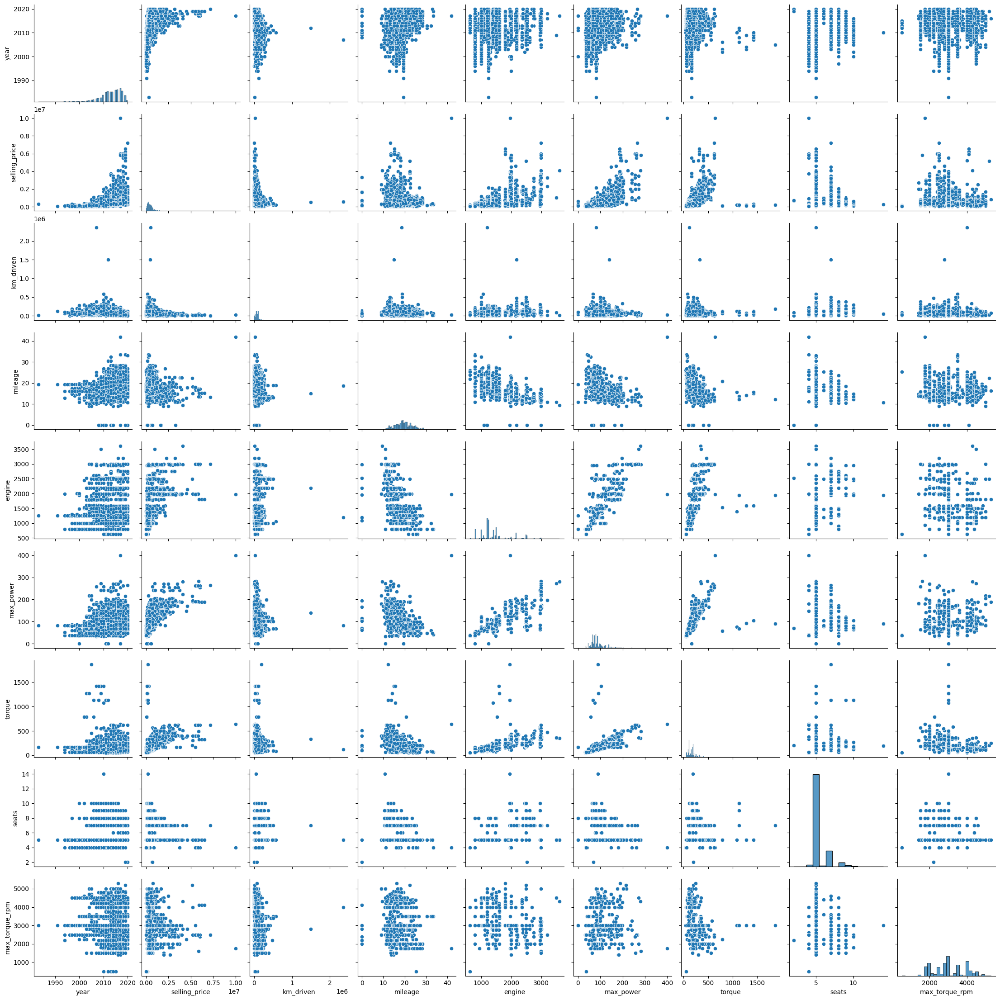

In [25]:
%matplotlib inline

sns.pairplot(data=df_train)
plt.show()

#### Вывод

Есть видимые зависимости между `year` и `km_driven`. Чем меньше год, тем меньше и пробег, есть несколько выбросов когда маленький год и большой пробег, что может говорить о том, что машина часто использовалась (возможно такси). Если смотреть по диагонали, то видно что только `mileage` и `max_torque_rpm` имеет нормальное распределение, остальные либо скошенные в одну из сторон либо, имеют пики, либо и то и другое.
`year` связан с `selling_price`, как и `km_driven`.

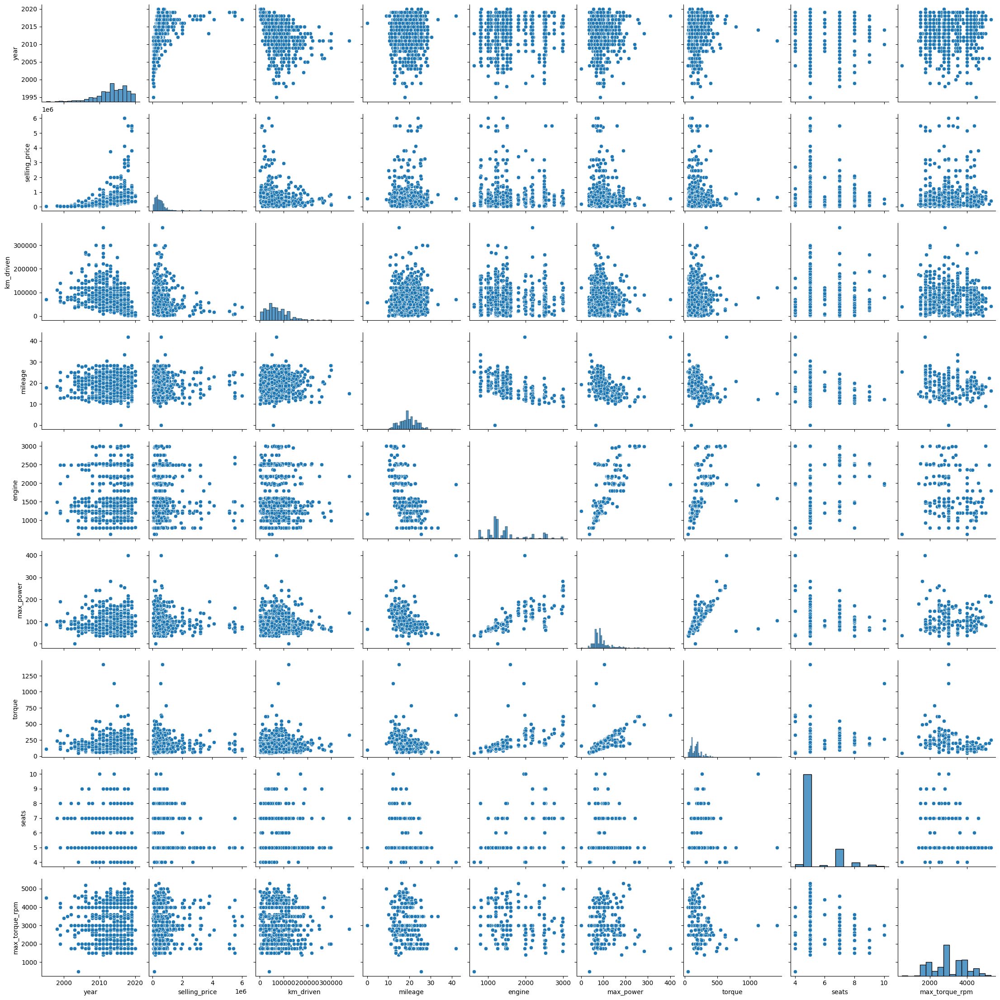

In [26]:
%matplotlib inline

sns.pairplot(data=df_test)
plt.show()

### Вывод

В целом на первый взгляд данные, при разделении на трейн и тест, оказались похожими.

### **Задание 9 (0.5 балла)**

И так, вы выдвинули гипотезы о наличии связи. Теперь давайте оценим эту связь в числах.

**Задание:**
- [ ] Получите значения коэффициента корреляции Пирсона для тренировочного набора данных при помощи `pd.corr()`
- [ ] По полученным корреляциям постройте тепловую карту (`heatmap` из бибилотеки seaborn)

,year,selling_price,km_driven,mileage,engine,max_power,torque,seats,max_torque_rpm
year,1.000000,0.427279,-0.368966,0.341334,0.002819,0.158207,0.052778,0.041178,0.058867
selling_price,0.427279,1.000000,-0.164828,-0.104769,0.447672,0.692725,0.458834,0.149953,-0.090095
km_driven,-0.368966,-0.164828,1.000000,-0.182086,0.229766,0.024379,0.113063,0.192328,-0.214458
mileage,0.341334,-0.104769,-0.182086,1.000000,-0.572893,-0.372197,-0.236354,-0.451059,-0.184029
engine,0.002819,0.447672,0.229766,-0.572893,1.000000,0.681247,0.597786,0.652172,-0.254179
max_power,0.158207,0.692725,0.024379,-0.372197,0.681247,1.000000,0.655509,0.242791,-0.028717
torque,0.052778,0.458834,0.113063,-0.236354,0.597786,0.655509,1.000000,0.317153,-0.347578
seats,0.041178,0.149953,0.192328,-0.451059,0.652172,0.242791,0.317153,1.000000,-0.213913
max_torque_rpm,0.058867,-0.090095,-0.214458,-0.184029,-0.254179,-0.028717,-0.347578,-0.213913,1.000000


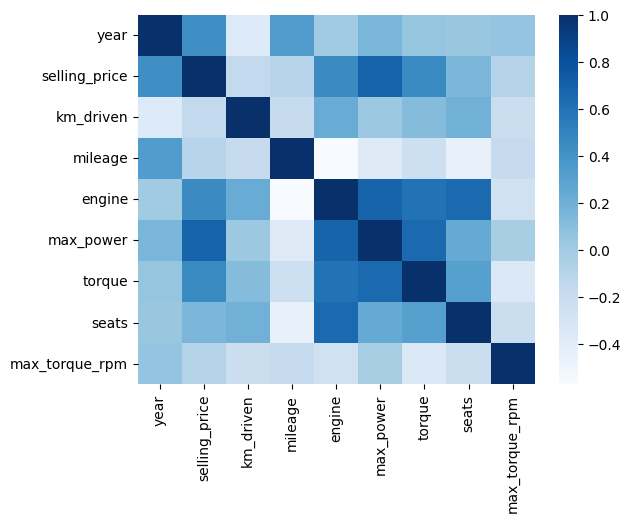

In [27]:
corr = df_train.corr(numeric_only=True)

display(corr)

sns.heatmap(corr, cmap='Blues')
plt.show()

- [ ] Ответьте на вопросы:
 - Какие 2 признака наименее скоррелированы между собой?
 - Между какими наблюдается довольно сильная положительная линейная зависимость?
 - Правильно ли, опираясь на данные, утверждать, что чем меньше год, тем, скорее всего, больше километров проехала машина к дате продажи?
 - Изучите типы корреляций в `pd.corr()`. Какую вы использовали по умолчанию?

### Ответы на вопросы:

#### Какие 2 признака наименее скоррелированы между собой?

1. `year` и `engine` = **0.002819**
2. `max_power` и `max_torque_rpm` = **-0.028717**

#### Между какими наблюдается довольно сильная положительная линейная зависимость?
1. `engine` и `max_power` = **0.681247**
2. `engine` и `seats` = **0.652172**
3. `max_power` и `torque` = **0.655509**

#### Правильно ли, опираясь на данные, утверждать, что чем меньше год, тем, скорее всего, больше километров проехала машина к дате продажи?

`year` и `km_driven` = **-0.368966**

Да правильно, здесь мы видим обратную связь => чем меньше год, тем больше пробег и *наоборот*

#### Изучите типы корреляций в pd.corr(). Какую вы использовали по умолчанию? 

Вопрос с подвохом на знание **pandas**?

По умолчанию используется корреляция Пирсона.

### **Задание 10 (0.6 балла)**

По умолчанию `pd.corr` возвращает корреляцию Пирсона, говорящую о линейной взаимосвязи. Но зависимости существуют не только линейные! В этой задаче, попробуйте измерить другие способы вычисления корреляций.

- [ ] Реализуйте корреляцию Спирмена/Кендала (на выбор) без использования библиотек (можно пользоваться только `numpy`). Сравните результаты вычисления с библиотечной реализацией
- [ ] Сделайте выводы


Постройте матрицу корреляции [phik](https://pypi.org/project/phik/)
- [ ] Проинтерпретируйте результаты


#### Формула корреляции Спирмена

p = 1 - (6 * Σd_i^2) / (n * (n^2 - 1))

In [28]:
def get_rank(data, n):
    indixes = np.argsort(data)
    
    ranks = np.empty(n, dtype=float)
    
    ranks[indixes] = np.arange(1, n + 1)
        
    count = 0
    
    while count < n:
        
        current_value = data[indixes[count]]
        j = count
        
        while j < n and data[indixes[j]] == current_value:
            j += 1
            
        if j - count > 1:
            rank = (ranks[indixes[count]] + ranks[indixes[j - 1]]) / 2
            
            ranks[indixes[count:j]] = rank
            
        count = j
        
    return ranks

def spearmen_correlation(x, y):
    if len(x) != len(y):
        raise ValueError('Len is not equal')

    n = len(x)

    rank_x = get_rank(x, n)
    rank_y = get_rank(y, n)

    d = rank_x - rank_y

    if n <= 1:
        return 0.0
    else:
        return 1 - (6 * np.sum(d ** 2)) / (n * (n ** 2 - 1))

def create_spearman_matrix(data_frame):
    columns = data_frame.columns

    corr_matrix = np.ones((len(columns), len(columns)))

    for i in range(len(columns)):
        for j in range(i + 1, len(columns)):
            corr = spearmen_correlation(data_frame[columns[i]].values, data_frame[columns[j]].values)
            
            corr_matrix[i, j] = corr
            corr_matrix[j, i] = corr
    
    return pd.DataFrame(corr_matrix, index=columns, columns=columns)


#### Спирман тренировочные данные df_train

In [29]:
spearman_matrix_train = create_spearman_matrix(df_train.select_dtypes(include=['number']))

display(f'{'---' * 10} Ручная реализация {'---' * 10}')
display(spearman_matrix_train)
display(f'{'---' * 10} Pandas реализация {'---' * 10}')
display(df_train.corr(method='spearman', numeric_only=True))

'------------------------------ Ручная реализация ------------------------------'

,year,selling_price,km_driven,mileage,engine,max_power,torque,seats,max_torque_rpm
year,1.000000,0.708146,-0.563074,0.348408,-0.031368,0.169264,0.107182,0.286074,0.075474
selling_price,0.708146,1.000000,-0.294527,0.026349,0.465252,0.612706,0.582571,0.473845,-0.138345
km_driven,-0.563074,-0.294527,1.000000,-0.197444,0.307153,0.041578,0.243834,0.387720,-0.304701
mileage,0.348408,0.026349,-0.197444,1.000000,-0.425435,-0.307898,-0.158513,-0.060193,-0.175720
engine,-0.031368,0.465252,0.307153,-0.425435,1.000000,0.714359,0.840866,0.624671,-0.363705
max_power,0.169264,0.612706,0.041578,-0.307898,0.714359,1.000000,0.778648,0.464332,-0.047581
torque,0.107182,0.582571,0.243834,-0.158513,0.840866,0.778648,1.000000,0.560916,-0.535350
seats,0.286074,0.473845,0.387720,-0.060193,0.624671,0.464332,0.560916,1.000000,0.109993
max_torque_rpm,0.075474,-0.138345,-0.304701,-0.175720,-0.363705,-0.047581,-0.535350,0.109993,1.000000


'------------------------------ Pandas реализация ------------------------------'

,year,selling_price,km_driven,mileage,engine,max_power,torque,seats,max_torque_rpm
year,1.000000,0.707123,-0.569659,0.346132,-0.038056,0.166267,0.103421,0.048291,0.067638
selling_price,0.707123,1.000000,-0.295665,0.026186,0.463577,0.612598,0.582204,0.317605,-0.144169
km_driven,-0.569659,-0.295665,1.000000,-0.198466,0.304504,0.040653,0.242650,0.195317,-0.312280
mileage,0.346132,0.026186,-0.198466,1.000000,-0.429871,-0.308231,-0.159504,-0.435458,-0.181705
engine,-0.038056,0.463577,0.304504,-0.429871,1.000000,0.713441,0.840260,0.527716,-0.374733
max_power,0.166267,0.612598,0.040653,-0.308231,0.713441,1.000000,0.778434,0.304094,-0.053031
torque,0.103421,0.582204,0.242650,-0.159504,0.840260,0.778434,1.000000,0.439727,-0.544272
seats,0.048291,0.317605,0.195317,-0.435458,0.527716,0.304094,0.439727,1.000000,-0.203407
max_torque_rpm,0.067638,-0.144169,-0.312280,-0.181705,-0.374733,-0.053031,-0.544272,-0.203407,1.000000


#### Спирман тестовые данные df_test

In [30]:
spearman_matrix_test = create_spearman_matrix(df_test.select_dtypes(include=['number']))

display(f'{'---' * 10} Ручная реализация {'---' * 10}')
display(spearman_matrix_test)
display(f'{'---' * 10} Pandas реализация {'---' * 10}')
display(df_test.corr(method='spearman', numeric_only=True))

'------------------------------ Ручная реализация ------------------------------'

,year,selling_price,km_driven,mileage,engine,max_power,torque,seats,max_torque_rpm
year,1.000000,0.711346,-0.589560,-0.041056,-0.024210,0.003022,-0.053237,0.213915,0.072694
selling_price,0.711346,1.000000,-0.326818,-0.047660,0.030367,0.028167,-0.003827,0.259688,0.044140
km_driven,-0.589560,-0.326818,1.000000,0.064166,0.010578,-0.032283,0.028795,0.251314,-0.036816
mileage,-0.041056,-0.047660,0.064166,1.000000,-0.486936,-0.337349,-0.193375,-0.124149,-0.122065
engine,-0.024210,0.030367,0.010578,-0.486936,1.000000,0.672841,0.828743,0.621855,-0.370108
max_power,0.003022,0.028167,-0.032283,-0.337349,0.672841,1.000000,0.749301,0.411095,0.001487
torque,-0.053237,-0.003827,0.028795,-0.193375,0.828743,0.749301,1.000000,0.522247,-0.529431
seats,0.213915,0.259688,0.251314,-0.124149,0.621855,0.411095,0.522247,1.000000,0.096576
max_torque_rpm,0.072694,0.044140,-0.036816,-0.122065,-0.370108,0.001487,-0.529431,0.096576,1.000000


'------------------------------ Pandas реализация ------------------------------'

,year,selling_price,km_driven,mileage,engine,max_power,torque,seats,max_torque_rpm
year,1.000000,0.710195,-0.596745,-0.045216,-0.031311,-0.001067,-0.058314,-0.034773,0.064499
selling_price,0.710195,1.000000,-0.327734,-0.047840,0.027374,0.027899,-0.004821,0.033498,0.039383
km_driven,-0.596745,-0.327734,1.000000,0.063527,0.007016,-0.033096,0.027336,0.021300,-0.042512
mileage,-0.045216,-0.047840,0.063527,1.000000,-0.491517,-0.337708,-0.194546,-0.493996,-0.127642
engine,-0.031311,0.027374,0.007016,-0.491517,1.000000,0.671802,0.828077,0.528780,-0.380950
max_power,-0.001067,0.027899,-0.033096,-0.337708,0.671802,1.000000,0.749029,0.241470,-0.003580
torque,-0.058314,-0.004821,0.027336,-0.194546,0.828077,0.749029,1.000000,0.393543,-0.538299
seats,-0.034773,0.033498,0.021300,-0.493996,0.528780,0.241470,0.393543,1.000000,-0.198175
max_torque_rpm,0.064499,0.039383,-0.042512,-0.127642,-0.380950,-0.003580,-0.538299,-0.198175,1.000000


In [31]:
df_train.phik_matrix()

interval columns not set, guessing: ['year', 'selling_price', 'km_driven', 'mileage', 'engine', 'max_power', 'torque', 'seats', 'max_torque_rpm']


,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats,max_torque_rpm
name,1.000000,0.948995,0.994871,0.000000,1.000000,0.799127,1.000000,0.830098,0.999690,1.000000,0.997908,0.999978,0.999985,0.999820
year,0.948995,1.000000,0.219841,0.081574,0.205834,0.232412,0.153714,0.418636,0.279253,0.213156,0.388533,0.184859,0.288178,0.342844
selling_price,0.994871,0.219841,1.000000,0.000000,0.157885,0.334505,0.463058,0.557641,0.649768,0.503682,0.872166,0.685681,0.196447,0.223314
km_driven,0.000000,0.081574,0.000000,1.000000,0.046285,0.000000,0.012824,0.087887,0.081625,0.210747,0.000000,0.000000,0.096223,0.084879
fuel,1.000000,0.205834,0.157885,0.046285,1.000000,0.050771,0.053721,0.030943,0.582304,0.644421,0.236798,0.350048,0.450714,0.682014
seller_type,0.799127,0.232412,0.334505,0.000000,0.050771,1.000000,0.127968,0.176612,0.064736,0.160346,0.331959,0.145384,0.032173,0.121462
transmission,1.000000,0.153714,0.463058,0.012824,0.053721,0.127968,1.000000,0.096990,0.331889,0.520161,0.511888,0.358336,0.045734,0.183302
owner,0.830098,0.418636,0.557641,0.087887,0.030943,0.176612,0.096990,1.000000,0.152406,0.186011,0.121828,0.060269,0.046741,0.252827
mileage,0.999690,0.279253,0.649768,0.081625,0.582304,0.064736,0.331889,0.152406,1.000000,0.588155,0.687158,0.377479,0.679979,0.392429
engine,1.000000,0.213156,0.503682,0.210747,0.644421,0.160346,0.520161,0.186011,0.588155,1.000000,0.721079,0.610504,0.603400,0.729836


### Выводы

#### Корреляция спирмана показала зависимости между:

1. `year` и `selling_price` => чем номее машина, тем выше цена.
2. `engine` and `torque`, `engine` and `max_power` => объем двигателя сильно влияет на крутящий момент и мощность.
3. `max_power` и `torque` => крутящий момент и мощность связаны.
4. `mileage` и `engine` => больше двигатель, больше расход.

В целом для нашей сферы, данные хорошие, нет странных взаимосвязей.

#### Расхождения ручной и библиотечной реализации

Скорее всего все дело в обработке связей. Я почитал как это делается в библиотеках, там пишут про переход к Пирсону в рангах где есть связки, а так как у меня в формуле нет перехода к Пирсону отсюда и расхождения. Или реализация кривая :)

#### Выводы по phik матрице

`phik` матрицу можно построить на любых данных, даже категориальных, показывает следующее:

1. `name` почти все связи со всеми признаками => 1.000
2. Совершенные мультиколлинеарности:
   * `name` и `fuel` = 1.000
   * `name` и `transmission` = 1.000
   * `name` и `engine` = 1.000
   * `name` и `torque` = 0.999978
   * `name` и `seats` = 0.999985
3. Признаки с обычными связями:
   * `year` и `selling_price` = 0.220 - слабая связь
   * `max_power` и `selling_price` = 0.872 - сильная свзяь
   * `km_driven` и `selling_price` = 0.000 - нет связи

Столбец `name` предсказывает все остальные переменные, в самом столбце находится информация которая есть в признаках. Надо обрабатывать `name`

### **Дополнительные визуализации (бонус 0.25 балла)**

Если вам кажется, что мы не попросили вас нарисовать какие-то очень важные зависимости, нарисуйте их и поясните.
Один график: 0.125 балла, при условии, что он обоснован.

# **Часть 2 (1.7 балла) | Модель только на вещественных признаках**

В этой части вам предстоит обучить модель только на вещественных признаках. Почему только на них?

Чем больше признаковое пространство — чем сложнее модель. А чем модель проще — тем лучше для скорости работы и интерпретации признаков.

За задания этой части вы можете набрать 1.7 основных и 0.15 бонусных балла;

### **Задание 11 (0.05 балла)**

Сделайте тренировочный и тестовый наборы. Они уже даны, достаточно просто отделить целевой признак. Перед разбиением создайте копию датафрейма, который будет хранить только вещественные признаки и используйте его (то есть категориальные столбцы (все, кроме seats) необходимо удалить).

В переменные y_train и y_test запишите значения целевых переменных. Используйте уже имеющиеся данные train и test. Если считаете уместным применить какую-то более хитрую технику разбиения — примените, но опишите, зачем.

In [32]:
df_copied_train = df_train.select_dtypes(include=['number']).copy()

y_train = df_copied_train['selling_price']
X_train = df_copied_train.drop('selling_price', axis=1)

display(y_train)
display(X_train)

0       450000
1       370000
2       225000
3       130000
4       440000
         ...  
5835    120000
5836    260000
5837    320000
5838    135000
5839    382000
Name: selling_price, Length: 5840, dtype: int64

,year,km_driven,mileage,engine,max_power,torque,seats,max_torque_rpm
0,2014,145500,23.40,1248,74.00,190.00,5,2000.0
1,2014,120000,21.14,1498,103.52,250.00,5,2500.0
2,2010,127000,23.00,1396,90.00,219.67,5,2750.0
3,2007,120000,16.10,1298,88.20,112.78,5,3000.0
4,2017,45000,20.14,1197,81.86,113.75,5,4000.0
...,...,...,...,...,...,...,...,...
5835,2008,191000,17.92,1086,62.10,96.10,5,3000.0
5836,2013,50000,18.90,998,67.10,90.00,5,3500.0
5837,2013,110000,18.50,1197,82.85,113.70,5,4000.0
5838,2007,119000,16.80,1493,110.00,235.36,5,3000.0


In [33]:
df_copied_test = df_test.select_dtypes(include=['number']).copy()

y_test = df_copied_test['selling_price']
X_test = df_copied_test.drop('selling_price', axis=1)

display(y_test)
display(X_test)

0      229999
1      665000
2      175000
3      635000
4      130000
        ...  
995    250000
996    440000
997    340000
998    350000
999    700000
Name: selling_price, Length: 1000, dtype: int64

,year,km_driven,mileage,engine,max_power,torque,seats,max_torque_rpm
0,2010,168000,23.40,1248,74.00,190.00,5,2000.0
1,2017,25000,21.14,1498,103.52,250.00,5,2500.0
2,2007,218463,23.00,1396,90.00,219.67,5,2750.0
3,2015,173000,16.10,1298,88.20,112.78,5,3000.0
4,2011,70000,20.14,1197,81.86,113.75,5,4000.0
...,...,...,...,...,...,...,...,...
995,2008,100000,22.54,1396,88.73,219.70,5,2750.0
996,2017,50000,20.36,1197,78.90,111.80,5,4000.0
997,2009,40000,17.00,1497,118.00,146.00,5,4800.0
998,2012,25000,22.74,796,47.30,69.00,5,3500.0


### **Задание 12. (0.2 балла)**

Построим нашу первую модель!
- [ ] Обучите классическую линейную регрессию с дефолтными параметрами. Посчтитайте $R^2$ и $MSE$ для трейна и для теста.
- [ ] Сделайте выводы по значениям метрик качества.

**Примечание:**

Здесь и далее $R^2$ и $MSE$ для трейна и для теста выводите везде, где требуется обучать модели, даже если в явном виде этого не просят. Иначе непонятно, как понять, насколько успешны наши эксперименты.

In [34]:
model = LinearRegression()

model.fit(X_train, y_train)

y_train_predict = model.predict(X_train)
y_test_predict = model.predict(X_test)

# Метрики для train
train_r2 = r2_score(y_train, y_train_predict)
train_mse = MSE(y_train, y_train_predict)
train_rmse = np.sqrt(train_mse)

# Метрики для test
test_r2 = r2_score(y_test, y_test_predict)
test_mse = MSE(y_test, y_test_predict)
test_rmse = np.sqrt(test_mse)

print(f'---' * 20)
print('Метрики качества модели')
print(f'---' * 20)
print(f'---' * 20)
print('Train')
print(f'---' * 20)
print(f'R2 train: {train_r2:.2f}')
print(f'MSE train: {train_mse:.2f}')
print(f'RMSE train: {train_rmse:.2f}')
print(f'business_metric: {business_metric(y_train, y_train_predict):.2f}')
print(f'your_business_metrics: {your_business_metrics(y_train, y_train_predict):.2f}')
print(f'---' * 20)
print(f'---' * 20)
print('Test')
print(f'---' * 20)
print(f'R2 test: {test_r2:.2f}')
print(f'MSE test: {test_mse:.2f}')
print(f'RMSE test: {test_rmse:.2f}')
print(f'business_metric: {business_metric(y_test, y_test_predict):.2f}')
print(f'your_business_metrics: {your_business_metrics(y_test, y_test_predict):.2f}')
print(f'---' * 20)
print(f'---' * 20)

------------------------------------------------------------
Метрики качества модели
------------------------------------------------------------
------------------------------------------------------------
Train
------------------------------------------------------------
R2 train: 0.60
MSE train: 114497074750.38
RMSE train: 338374.16
business_metric: 0.22
your_business_metrics: 0.25
------------------------------------------------------------
------------------------------------------------------------
Test
------------------------------------------------------------
R2 test: -0.11
MSE test: 638035918966.75
RMSE test: 798771.51
business_metric: 0.09
your_business_metrics: 0.10
------------------------------------------------------------
------------------------------------------------------------


### Выводы

1. R^2 на обучающих данных имеет 60%, в то время как на тестовых он уходит в минус => модель плохо обучена или имеется переобучение
2. RMSE train = **338095**, в то время как RMSE test = **797819** => рост ошибки более чем в 2 раза
3. Необходима регуляризация Lasso или Ridge

### **Задание 13 (0.15 балла)**

- [ ] Реализуйте $R^2$ руками. Приведите формулу $R^2$ и объясните каждую компоненту метрики

#### Формула R^2

R^2 = 1 - (SS_res / SS_tot)

* SS_res = Σ(y_i - ŷ_i)^2 - **ошибка модели (mse)**

    y_i = текущее значение
    ŷ_i = предсказанное значение

* SS_tot = Σ(y_i - ȳ)^2 - **общая дисперсия**

    y_i = текущее значение
    ȳ = среднее значение целевой переменной

#### R^2 показатели

* Если R^2 = 1: SS_res = 0 (идеальные предсказания)

* Если R^2 = 0: SS_res = SS_tot (модель не лучше, чем предсказывает среднее значение)

* Если R^2 < 0: Модель предсказывает хуже чем модель которая предсказывает средний ответ на всех объектах => плохая модель или переобучена

In [35]:
def r2_manual(y_goal, y_predict):
    y_goal = np.array(y_goal)
    y_predict = np.array(y_predict)
    
    if len(y_goal) != len(y_predict):
        raise ValueError("Length is not equal")
    
    y_mean = np.mean(y_goal)
  
    ss_res = np.sum((y_goal - y_predict) ** 2)
    
    ss_tot = np.sum((y_goal - y_mean) ** 2)
    
    if ss_tot == 0:
        return 0.0
    
    return 1 - (ss_res / ss_tot)

train_r2_manual = r2_manual(y_train, y_train_predict)
test_r2_manual = r2_manual(y_test, y_test_predict)

print(f'---' * 20)
print('R^2 Manual')
print(f'---' * 20)
print(f'---' * 20)
print('Train')
print(f'---' * 20)
print(f'train: {train_r2_manual:.2f}')
print(f'---' * 20)
print(f'---' * 20)
print('Test')
print(f'---' * 20)
print(f'test: {test_r2_manual:.2f}')
print(f'---' * 20)
print(f'---' * 20)

------------------------------------------------------------
R^2 Manual
------------------------------------------------------------
------------------------------------------------------------
Train
------------------------------------------------------------
train: 0.60
------------------------------------------------------------
------------------------------------------------------------
Test
------------------------------------------------------------
test: -0.11
------------------------------------------------------------
------------------------------------------------------------


**Аналогично с бибилотечной реализацией**

### **Бонус (0.15 балла)**

- [ ] Реализуйте [$\text{adjusted}-R^2$](https://en.wikipedia.org/wiki/Coefficient_of_determination).
- [ ] Объясните, когда применяется $\text{adjusted}-R^2$?

#### Формула $\text{adjusted}-R^2$

$\text{adjusted}-R^2$ = 1 - $\text[(1 - R^2) * (n - 1) / (n - p - 1)]$

* R^2 — обычный коэффициент детерминации

* n — количество наблюдений (образцов)

* p — количество признаков (features) в модели

* 1 в знаменателе — учитывает свободный член (intercept)

#### Когда применяется $\text{adjusted}-R^2$?

* При добавлении новых признаков не увеличивается в отличии от простого R^2
* Не приводит к переобучению
* "Штрафует" модель за добавление бесполезных признаков
* Более честная оценка модели

In [36]:
def adjusted_r2_manual(y_goal, y_predict, n_features):
    r2 = r2_manual(y_goal, y_predict)
    
    n = len(y_goal)
    
    if n <= n_features + 1:
        raise ValueError(f"So many more features! n={n}, p={n_features}")
    
    adj_r2 = 1 - (1 - r2) * (n - 1) / (n - n_features - 1)
    
    return adj_r2

train_adjusted_r2_manual = adjusted_r2_manual(y_train, y_train_predict, 2)
test_adjusted_r2_manual = adjusted_r2_manual(y_test, y_test_predict, 2)

print(f'---' * 20)
print('Adjusted_r2_manual with 2 features')
print(f'---' * 20)
print(f'---' * 20)
print('Train')
print(f'---' * 20)
print(f'train: {train_adjusted_r2_manual:.2f}')
print(f'---' * 20)
print(f'---' * 20)
print('Test')
print(f'---' * 20)
print(f'test: {test_adjusted_r2_manual:.2f}')
print(f'---' * 20)
print(f'---' * 20)

print(f'---' * 20)
print('Adjusted_r2_manual with 5 features')
print(f'---' * 20)
print(f'---' * 20)
print('Train')
print(f'---' * 20)
print(f'train: {train_adjusted_r2_manual:.2f}')
print(f'---' * 20)
print(f'---' * 20)
print('Test')
print(f'---' * 20)
print(f'test: {test_adjusted_r2_manual:.2f}')
print(f'---' * 20)
print(f'---' * 20)

------------------------------------------------------------
Adjusted_r2_manual with 2 features
------------------------------------------------------------
------------------------------------------------------------
Train
------------------------------------------------------------
train: 0.60
------------------------------------------------------------
------------------------------------------------------------
Test
------------------------------------------------------------
test: -0.11
------------------------------------------------------------
------------------------------------------------------------
------------------------------------------------------------
Adjusted_r2_manual with 5 features
------------------------------------------------------------
------------------------------------------------------------
Train
------------------------------------------------------------
train: 0.60
------------------------------------------------------------
-----------------------

### Вывод

Для наших данных $\text{adjusted}-R^2$ показал точно такие же показатели чем и просто R2 

### **Задание 14 (0.05 балла)**

Всегда есть место совершенству. Поэтому давайте попробуем улучшить модель. При помощи стандартизации признаков.

- [ ] Стандартизируйте значения в тренировочных и тестовых данных. Стандартизатор **обучайте только на `train`**.

In [37]:
scaler_x = StandardScaler()

X_train_scaled = scaler_x.fit_transform(X_train)
X_test_scaled = scaler_x.transform(X_test)

X_train_scaled = pd.DataFrame(X_train_scaled, columns=X_train.columns, index=X_train.index)
X_test_scaled = pd.DataFrame(X_test_scaled, columns=X_test.columns, index=X_test.index)

print(f'---' * 20)
print('X_train_scaled')
print(f'---' * 20)
display(X_train_scaled)
print(f'---' * 20)
print('X_test_scaled')
print(f'---' * 20)
display(X_test_scaled)
print(f'---' * 20)

------------------------------------------------------------
X_train_scaled
------------------------------------------------------------


,year,km_driven,mileage,engine,max_power,torque,seats,max_torque_rpm
0,0.139570,1.191152,0.995867,-0.373643,-0.438819,0.139390,-0.434419,-1.203647
1,0.139570,0.766619,0.428830,0.141162,0.493632,0.700329,-0.434419,-0.624266
2,-0.837167,0.883158,0.895506,-0.068879,0.066574,0.416774,-0.434419,-0.334575
3,-1.569719,0.766619,-0.835712,-0.270682,0.009718,-0.582539,-0.434419,-0.044884
4,0.872122,-0.482007,0.177929,-0.478663,-0.190545,-0.573470,-0.434419,1.113880
...,...,...,...,...,...,...,...,...
5835,-1.325535,1.948653,-0.379072,-0.707236,-0.814705,-0.738480,-0.434419,-0.044884
5836,-0.104614,-0.398765,-0.133189,-0.888447,-0.656770,-0.795509,-0.434419,0.534498
5837,-0.104614,0.600136,-0.233549,-0.478663,-0.159273,-0.573938,-0.434419,1.113880
5838,-1.569719,0.749971,-0.660081,0.130865,0.698316,0.563460,-0.434419,-0.044884


------------------------------------------------------------
X_test_scaled
------------------------------------------------------------


,year,km_driven,mileage,engine,max_power,torque,seats,max_torque_rpm
0,-0.837167,1.565740,0.995867,-0.373643,-0.438819,0.139390,-0.434419,-1.203647
1,0.872122,-0.814974,0.428830,0.141162,0.493632,0.700329,-0.434419,-0.624266
2,-1.569719,2.405866,0.895506,-0.068879,0.066574,0.416774,-0.434419,-0.334575
3,0.383754,1.648982,-0.835712,-0.270682,0.009718,-0.582539,-0.434419,-0.044884
4,-0.592983,-0.065798,0.177929,-0.478663,-0.190545,-0.573470,-0.434419,1.113880
...,...,...,...,...,...,...,...,...
995,-1.325535,0.433652,0.780092,-0.068879,0.026459,0.417055,-0.434419,-0.334575
996,0.872122,-0.398765,0.233127,-0.478663,-0.284042,-0.591701,-0.434419,1.113880
997,-1.081351,-0.565249,-0.609901,0.139102,0.951012,-0.271966,-0.434419,2.040890
998,-0.348799,-0.814974,0.830272,-1.304409,-1.282194,-0.991837,-0.434419,0.534498


------------------------------------------------------------


### INFO

Здесь я стандартизировал данные для наглядности, и потому что требовало задание, в дальнейшем везде в тестах будет использоваться конструкция `pipline` со стандартизатором.

In [38]:
pipline = Pipeline([
    ('scaler', StandardScaler()),
    ('model', LinearRegression())
])

pipline.fit(X_train, y_train)

y_train_predict_2 = pipline.predict(X_train)
y_test_predict_2 = pipline.predict(X_test)

# Метрики для train
train_r2_2 = r2_score(y_train, y_train_predict_2)
train_mse_2 = MSE(y_train, y_train_predict_2)
train_rmse_2 = np.sqrt(train_mse_2)

# Метрики для test
test_r2_2 = r2_score(y_test, y_test_predict_2)
test_mse_2 = MSE(y_test, y_test_predict_2)
test_rmse_2 = np.sqrt(test_mse_2)

print(f'---' * 20)
print('Метрики качества модели')
print(f'---' * 20)
print(f'---' * 20)
print('Train')
print(f'---' * 20)
print(f'R2 train: {train_r2_2:.2f}')
print(f'MSE train: {train_mse_2:.2f}')
print(f'RMSE train: {train_rmse_2:.2f}')
print(f'business_metric: {business_metric(y_train, y_train_predict_2):.2f}')
print(f'your_business_metrics: {your_business_metrics(y_train, y_train_predict_2):.2f}')
print(f'---' * 20)
print(f'---' * 20)
print('Test')
print(f'---' * 20)
print(f'R2 test: {test_r2_2:.2f}')
print(f'MSE test: {test_mse_2:.2f}')
print(f'RMSE test: {test_rmse_2:.2f}')
print(f'business_metric: {business_metric(y_test, y_test_predict_2):.2f}')
print(f'your_business_metrics: {your_business_metrics(y_test, y_test_predict_2):.2f}')
print(f'---' * 20)
print(f'---' * 20)

------------------------------------------------------------
Метрики качества модели
------------------------------------------------------------
------------------------------------------------------------
Train
------------------------------------------------------------
R2 train: 0.60
MSE train: 114497074750.38
RMSE train: 338374.16
business_metric: 0.22
your_business_metrics: 0.25
------------------------------------------------------------
------------------------------------------------------------
Test
------------------------------------------------------------
R2 test: -0.11
MSE test: 638035918966.75
RMSE test: 798771.51
business_metric: 0.09
your_business_metrics: 0.10
------------------------------------------------------------
------------------------------------------------------------


### **Задание 15 (0.1 балла)**

Хотя стандартизация не помогла сильно прибавить в качестве она открыла возможность интерпретировать важность признаков в модели. Правило интерпретации такое:

Чем больше коэффициент $\beta_i$ по модулю, тем важнее признак.

**Ответьте на вопрос:**

- [ ] Какой признак оказался наиболее информативным в предсказании цены?

In [39]:
coefficients = pipline.named_steps['model'].coef_
features = X_train.columns

df_coef = pd.DataFrame({
    'Признак': features,
    'Вес': coefficients,
    'Abs': np.abs(coefficients)
})

df_coef_sorted = df_coef.sort_values('Abs', ascending=False)

df_coef_sorted

,Признак,Вес,Abs
4,max_power,336214.693519,336214.693519
0,year,166099.306381,166099.306381
7,max_torque_rpm,-63760.260430,63760.260430
1,km_driven,-49477.923295,49477.923295
6,seats,-29705.095392,29705.095392
3,engine,22810.455161,22810.455161
2,mileage,-10312.357578,10312.357578
5,torque,-6724.289641,6724.289641


### Вывод

Самый важный признак оказался `max_power`. Увеличение признака влечет за собой увеличение цены. 
Увеличение `km_driven`, влечет снижение цены.

### **Задание 16 (0.25 балла)**

Попробуем улучшить нашу модель с помощью применения регуляризации. Для этого воспльзуемся `Lasso` регрессией.  Кроме того, попробуйте использовать её теоретическое свойство отбора признаков, за счет зануления незначимых коэффициентов.

**Задание:**

- [ ] Обучите Lasso регрессию на тренировочном наборе данных с нормализованными признаками. Оцените её качество
- [ ] Проверьте, занулила ли L1-регуляризация с параметрами по умолчанию какие-нибудь веса? Предположите почему.

In [40]:
alpha = 0.01 * np.std(y_train)

pipline_lasso = Pipeline([
    ('scaler', StandardScaler()),
    ('model', Lasso(alpha=alpha, max_iter=10000, random_state=42))
])

pipline_lasso.fit(X_train, y_train)

y_train_predict_lasso = pipline_lasso.predict(X_train)
y_test_predict_lasso = pipline_lasso.predict(X_test)

train_r2_lasso = r2_score(y_train, y_train_predict_lasso)
test_r2_lasso = r2_score(y_test, y_test_predict_lasso)

train_mse_lasso = MSE(y_train, y_train_predict_lasso)
test_mse_lasso = MSE(y_test, y_test_predict_lasso)

train_rmse_lasso = np.sqrt(train_mse_lasso)
test_rmse_lasso = np.sqrt(test_mse_lasso)

print(f'---' * 20)
print('Метрики качества модели')
print(f'---' * 20)
print(f'---' * 20)
print('Train')
print(f'---' * 20)
print(f'R2 train: {train_r2_lasso:.2f}')
print(f'MSE train: {train_mse_lasso:.2f}')
print(f'RMSE train: {train_rmse_lasso:.2f}')
print(f'business_metric: {business_metric(y_train, y_train_predict_lasso):.2f}')
print(f'your_business_metrics: {your_business_metrics(y_train, y_train_predict_lasso):.2f}')
print(f'---' * 20)
print(f'---' * 20)
print('Test')
print(f'---' * 20)
print(f'R2 test: {test_r2_lasso:.2f}')
print(f'MSE test: {test_mse_lasso:.2f}')
print(f'RMSE test: {test_rmse_lasso:.2f}')
print(f'business_metric: {business_metric(y_test, y_test_predict_lasso):.2f}')
print(f'your_business_metrics: {your_business_metrics(y_test, y_test_predict_lasso):.2f}')
print(f'---' * 20)
print(f'---' * 20)

print("Alpha:", pipline_lasso.named_steps['model'].alpha)
coefficients = pipline_lasso.named_steps['model'].coef_
features = X_train.columns

df_coef = pd.DataFrame({
    'Признак': features,
    'Вес': coefficients,
    'Abs': np.abs(coefficients)
})

df_coef_sorted = df_coef.sort_values('Abs', ascending=False)

df_coef_sorted

------------------------------------------------------------
Метрики качества модели
------------------------------------------------------------
------------------------------------------------------------
Train
------------------------------------------------------------
R2 train: 0.60
MSE train: 114823165181.10
RMSE train: 338855.67
business_metric: 0.22
your_business_metrics: 0.26
------------------------------------------------------------
------------------------------------------------------------
Test
------------------------------------------------------------
R2 test: -0.11
MSE test: 636851916846.87
RMSE test: 798030.02
business_metric: 0.09
your_business_metrics: 0.10
------------------------------------------------------------
------------------------------------------------------------
Alpha: 5353.861581679961


,Признак,Вес,Abs
4,max_power,337611.796164,337611.796164
0,year,157225.970215,157225.970215
7,max_torque_rpm,-52197.137467,52197.137467
1,km_driven,-44039.145633,44039.145633
6,seats,-10426.793287,10426.793287
3,engine,7551.678003,7551.678003
2,mileage,-0.000000,0.000000
5,torque,0.000000,0.000000


### Вывод

Был подобран оптимальный параметр `alpha` = **5353.86**, при котором зануляются 2 незначительных признака `mileage` и `torque`. Параметр был подобран простым условием `0.01 * np.std(y_train)`

### **Задание 17. Финальный рывок (0.4 балла)**

До этого мы с вами использовали `train` для обучения и `test` для прогнозирования. Но у нас есть ещё одна задача — подобрать оптимальные параметры модели. Для этого используем кросс-валидацию, описанную на семинарах.

Кроме того, выжмем максимум из модификаций регрессии. Построим `ElasticNet`. И сделаем всё по порядку.

**Ваша задача 1:**

- [ ] Перебором по сетке (c 10-ю фолдами) подберите оптимальные параметры для Lasso-регрессии. Вам пригодится класс [GridSearchCV](https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.GridSearchCV.html).
- [ ] Ответьте на вопросы:
 - Сколько грид-сёрчу пришлось обучать моделей?
 - Что значит каждый параметр `param_grid`, который вы заполняли для `GridSearch`? Опишите каждый
 - Какой коэффициент регуляризации у лучшей из перебранных моделей? Занулились ли какие-нибудь из весов при такой регуляризации?

In [41]:
pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('lasso', Lasso(random_state=42, max_iter=50000))
])

param_grid = {
    'lasso__alpha': np.logspace(-4, 2, 20),
    'lasso__selection': ['random', 'cyclic']
}

grid_search_1 = GridSearchCV(
    pipeline,
    param_grid=param_grid,
    cv=10,
    scoring='r2',
    n_jobs=-1,
    verbose=1
)

grid_search_1.fit(X_train, y_train)

y_train_predict_lasso = grid_search_1.predict(X_train)
y_test_predict_lasso = grid_search_1.predict(X_test)

train_r2_lasso = r2_score(y_train, y_train_predict_lasso)
test_r2_lasso = r2_score(y_test, y_test_predict_lasso)

train_mse_lasso = MSE(y_train, y_train_predict_lasso)
test_mse_lasso = MSE(y_test, y_test_predict_lasso)

train_rmse_lasso = np.sqrt(train_mse_lasso)
test_rmse_lasso = np.sqrt(test_mse_lasso)

best_pipeline = grid_search_1.best_estimator_
best_alpha = best_pipeline.named_steps['lasso'].alpha

print(f'---' * 20)
print('Метрики качества модели', f'alpha = {best_alpha}')
print(f'---' * 20)
print(f'---' * 20)
print('Train')
print(f'---' * 20)
print(f'R2 train: {train_r2_lasso:.2f}')
print(f'MSE train: {train_mse_lasso:.2f}')
print(f'RMSE train: {train_rmse_lasso:.2f}')
print(f'business_metric: {business_metric(y_train, y_train_predict_lasso):.2f}')
print(f'your_business_metrics: {your_business_metrics(y_train, y_train_predict_lasso):.2f}')
print(f'---' * 20)
print(f'---' * 20)
print('Test')
print(f'---' * 20)
print(f'R2 test: {test_r2_lasso:.2f}')
print(f'MSE test: {test_mse_lasso:.2f}')
print(f'RMSE test: {test_rmse_lasso:.2f}')
print(f'business_metric: {business_metric(y_test, y_test_predict_lasso):.2f}')
print(f'your_business_metrics: {your_business_metrics(y_test, y_test_predict_lasso):.2f}')
print(f'---' * 20)
print(f'---' * 20)

coefficients = grid_search_1.best_estimator_.named_steps['lasso'].coef_
features = X_train_scaled.columns

df_coef = pd.DataFrame({
    'Признак': features,
    'Вес': coefficients,
    'Abs': np.abs(coefficients)
})

df_coef_sorted = df_coef.sort_values('Abs', ascending=False)

display(df_coef_sorted)

Fitting 10 folds for each of 40 candidates, totalling 400 fits
------------------------------------------------------------
Метрики качества модели alpha = 100.0
------------------------------------------------------------
------------------------------------------------------------
Train
------------------------------------------------------------
R2 train: 0.60
MSE train: 114497294760.03
RMSE train: 338374.49
business_metric: 0.22
your_business_metrics: 0.25
------------------------------------------------------------
------------------------------------------------------------
Test
------------------------------------------------------------
R2 test: -0.11
MSE test: 638014543421.91
RMSE test: 798758.13
business_metric: 0.09
your_business_metrics: 0.10
------------------------------------------------------------
------------------------------------------------------------


,Признак,Вес,Abs
4,max_power,336085.051483,336085.051483
0,year,165879.181224,165879.181224
7,max_torque_rpm,-63403.221864,63403.221864
1,km_driven,-49380.877754,49380.877754
6,seats,-29325.278904,29325.278904
3,engine,22567.311981,22567.311981
2,mileage,-9969.861002,9969.861002
5,torque,-6308.508645,6308.508645


### Вывод

1. Грид серчу пришлось обучить 400 моделей.
2. Параметры
   
* alpha: коэффициент регуляризации - параметр L1-регуляризации, контролирует силу штрафа за большие веса
* selection: говорит как будем выбирать признаки, попорядку или рандомно.

3. Лучший коэффициент регуляризации `100`, как видно из таблицы веса не занулились.

**Ваша задача 2:**

- [ ] Перебором по сетке (c 10-ю фолдами) подберите оптимальные параметры для [ElasticNet](https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.ElasticNet.html) регрессии.
- [ ] Ответьте на вопрос:
 - Сколько грид-сёрчу пришлось обучать моделей?
 - Какие гиперпараметры соответствуют лучшей (по выбранной метрике качества) из перебранных моделей?

In [42]:
pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('model', ElasticNet(random_state=42, max_iter=50000))
])

param_grid = {
    'model__alpha': np.logspace(-4, 2, 100),
    'model__l1_ratio': [0.1, 0.3, 0.5, 0.7, 0.9, 1.0]
}

grid_search = GridSearchCV(
    pipeline,
    param_grid,
    cv=10,
    scoring='r2',
    n_jobs=-1,
    verbose=1
)

grid_search.fit(X_train, y_train)

y_train_predict_lasso = grid_search.predict(X_train)
y_test_predict_lasso = grid_search.predict(X_test)

train_r2_lasso = r2_score(y_train, y_train_predict_lasso)
test_r2_lasso = r2_score(y_test, y_test_predict_lasso)

train_mse_lasso = MSE(y_train, y_train_predict_lasso)
test_mse_lasso = MSE(y_test, y_test_predict_lasso)

train_rmse_lasso = np.sqrt(train_mse_lasso)
test_rmse_lasso = np.sqrt(test_mse_lasso)

print("Лучшие параметры:", grid_search.best_params_)
print("Лучший R2 (CV):", grid_search.best_score_)

print(f'---' * 20)
print('Метрики качества модели')
print(f'---' * 20)
print(f'---' * 20)
print('Train')
print(f'---' * 20)
print(f'R2 train: {train_r2_lasso:.2f}')
print(f'MSE train: {train_mse_lasso:.2f}')
print(f'RMSE train: {train_rmse_lasso:.2f}')
print(f'business_metric: {business_metric(y_train, y_train_predict_lasso):.2f}')
print(f'your_business_metrics: {your_business_metrics(y_train, y_train_predict_lasso):.2f}')
print(f'---' * 20)
print(f'---' * 20)
print('Test')
print(f'---' * 20)
print(f'R2 test: {test_r2_lasso:.2f}')
print(f'MSE test: {test_mse_lasso:.2f}')
print(f'RMSE test: {test_rmse_lasso:.2f}')
print(f'business_metric: {business_metric(y_test, y_test_predict_lasso):.2f}')
print(f'your_business_metrics: {your_business_metrics(y_test, y_test_predict_lasso):.2f}')
print(f'---' * 20)
print(f'---' * 20)

coefficients = grid_search.best_estimator_.named_steps['model'].coef_
features = X_train_scaled.columns

df_coef = pd.DataFrame({
    'Признак': features,
    'Вес': coefficients,
    'Abs': np.abs(coefficients)
})

df_coef_sorted = df_coef.sort_values('Abs', ascending=False)

display(df_coef_sorted)


Fitting 10 folds for each of 600 candidates, totalling 6000 fits
Лучшие параметры: {'model__alpha': np.float64(0.1873817422860385), 'model__l1_ratio': 0.5}
Лучший R2 (CV): 0.5798782397300366
------------------------------------------------------------
Метрики качества модели
------------------------------------------------------------
------------------------------------------------------------
Train
------------------------------------------------------------
R2 train: 0.60
MSE train: 116071015629.73
RMSE train: 340691.97
business_metric: 0.23
your_business_metrics: 0.26
------------------------------------------------------------
------------------------------------------------------------
Test
------------------------------------------------------------
R2 test: -0.08
MSE test: 619952925826.37
RMSE test: 787370.89
business_metric: 0.10
your_business_metrics: 0.11
------------------------------------------------------------
------------------------------------------------------------

,Признак,Вес,Abs
4,max_power,276148.523959,276148.523959
0,year,154563.521822,154563.521822
3,engine,53370.856154,53370.856154
1,km_driven,-51113.973514,51113.973514
7,max_torque_rpm,-41817.966499,41817.966499
6,seats,-32075.443406,32075.443406
5,torque,23485.022892,23485.022892
2,mileage,-1291.314941,1291.314941


### Вывод

1. Пришлось обучить 6000 моделей
2. Оптимальные параметры получились такие:

   alpha: 0.1874,
   l1_ratio: 0.5

   При увеличении кол-ва итераций в alpha, модель не давала лучшие показатели, можно сказать эти параметры оказались наилутшими.

### **Задание 18 (0.35 балла)**

И так, вы обучили все варианты регуляризаций, доступные в sklearn, но не все, что мы обсудили на занятии! И следующее задание о забытой - $L0$ регуляризации.


**Ваша задача:**>
- [ ] Реализуйте модель с $L0$-регуляризаицей.
- [ ] Обучите модель на данных и проанализируйте результат, экспериментируя с коэффициенитом регуляризации
- [ ] Проанализируйте результаты обучения

**Важно:**

Вопреки тому, что L0 не реализована в стандартных пакетах, концепция данной регуляризации не является мертвой. Она может встречаться в [статьях](https://arxiv.org/abs/1712.01312) и экспериментах.



In [43]:
pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('feature_selector', SelectFromModel(
        Lasso(alpha=0.1, max_iter=10000, random_state=42),
        threshold=1e-6
    )),
    ('model', ElasticNet(random_state=42, max_iter=50000))
])

param_grid = {
    'model__alpha': np.logspace(-3, 1, 50),
    'model__l1_ratio': [0.5, 0.7, 0.9, 1.0]
}

l0_model = GridSearchCV(
    pipeline,
    param_grid,
    cv=10,
    scoring='r2',
    n_jobs=-1,
    verbose=1
)

l0_model.fit(X_train, y_train)

y_train_predict_lasso = l0_model.predict(X_train)
y_test_predict_lasso = l0_model.predict(X_test)

train_r2_lasso = r2_score(y_train, y_train_predict_lasso)
test_r2_lasso = r2_score(y_test, y_test_predict_lasso)

train_mse_lasso = MSE(y_train, y_train_predict_lasso)
test_mse_lasso = MSE(y_test, y_test_predict_lasso)

train_rmse_lasso = np.sqrt(train_mse_lasso)
test_rmse_lasso = np.sqrt(test_mse_lasso)

print("Лучшие параметры:", l0_model.best_params_)
print("Лучший R2 (CV):", l0_model.best_score_)

print(f'---' * 20)
print('Метрики качества модели')
print(f'---' * 20)
print(f'---' * 20)
print('Train')
print(f'---' * 20)
print(f'R2 train: {train_r2_lasso:.2f}')
print(f'MSE train: {train_mse_lasso:.2f}')
print(f'RMSE train: {train_rmse_lasso:.2f}')
print(f'business_metric: {business_metric(y_train, y_train_predict_lasso):.2f}')
print(f'your_business_metrics: {your_business_metrics(y_train, y_train_predict_lasso):.2f}')
print(f'---' * 20)
print(f'---' * 20)
print('Test')
print(f'---' * 20)
print(f'R2 test: {test_r2_lasso:.2f}')
print(f'MSE test: {test_mse_lasso:.2f}')
print(f'RMSE test: {test_rmse_lasso:.2f}')
print(f'business_metric: {business_metric(y_test, y_test_predict_lasso):.2f}')
print(f'your_business_metrics: {your_business_metrics(y_test, y_test_predict_lasso):.2f}')
print(f'---' * 20)
print(f'---' * 20)

coefficients = l0_model.best_estimator_.named_steps['model'].coef_
features = X_train_scaled.columns

df_coef = pd.DataFrame({
    'Признак': features,
    'Вес': coefficients,
    'Abs': np.abs(coefficients)
})

df_coef_sorted = df_coef.sort_values('Abs', ascending=False)

display(df_coef_sorted)


Fitting 10 folds for each of 200 candidates, totalling 2000 fits
Лучшие параметры: {'model__alpha': np.float64(0.19306977288832497), 'model__l1_ratio': 0.5}
Лучший R2 (CV): 0.5798745306708369
------------------------------------------------------------
Метрики качества модели
------------------------------------------------------------
------------------------------------------------------------
Train
------------------------------------------------------------
R2 train: 0.59
MSE train: 116143664014.20
RMSE train: 340798.57
business_metric: 0.23
your_business_metrics: 0.26
------------------------------------------------------------
------------------------------------------------------------
Test
------------------------------------------------------------
R2 test: -0.08
MSE test: 619553477692.10
RMSE test: 787117.19
business_metric: 0.10
your_business_metrics: 0.11
------------------------------------------------------------
-----------------------------------------------------------

,Признак,Вес,Abs
4,max_power,274873.247753,274873.247753
0,year,154243.718348,154243.718348
3,engine,53816.732638,53816.732638
1,km_driven,-51124.720075,51124.720075
7,max_torque_rpm,-41390.914788,41390.914788
6,seats,-32000.254227,32000.254227
5,torque,24103.050945,24103.050945
2,mileage,-1154.294293,1154.294293


### Выводы

L0 регулязация немного прибавила в качестве R^2, но все равно остается ниже нуля.

# **Часть 3 (0.5 балла) | Добавляем категориальные фичи**

Попробуем для улучшения модели дать ей больше признаков. Добавим категориальные фичи.

За эту часть можно набрать 0.5 основных балла.



### **Задание 19 (0.1 балла)**

Проанализируйте столбец `name`. Очевидно, что эта переменная является категориальной, однако категорий в ней много.

- [ ] Предобработайте столбец `name`, чтобы избежать его удаления

In [44]:
df_train_cat = df_train[['name'] + df_train.select_dtypes(include='number').columns.tolist()]
df_test_cat = df_test[['name'] + df_test.select_dtypes(include='number').columns.tolist()]

split_parts = df_train_cat['name'].str.split(' ', n=2, expand=True)

display(split_parts)

df_train_cat['name'] = split_parts[0].apply(lambda v: v.strip().lower())
df_train_cat['model'] = split_parts[1].apply(lambda v: v.strip().lower())

y_train_cat = df_train_cat['selling_price']
X_train_cat = df_train_cat.drop('selling_price', axis=1)

split_parts = df_test_cat['name'].str.split(' ', n=2, expand=True)

df_test_cat['name'] = split_parts[0].apply(lambda v: v.strip().lower())
df_test_cat['model'] = split_parts[1].apply(lambda v: v.strip().lower())

y_test_cat = df_test_cat['selling_price']
X_test_cat = df_test_cat.drop('selling_price', axis=1)

display(df_train_cat)
display(df_test_cat)

,0,1,2
0,Maruti,Swift,Dzire VDI
1,Skoda,Rapid,1.5 TDI Ambition
2,Hyundai,i20,Sportz Diesel
3,Maruti,Swift,VXI BSIII
4,Hyundai,Xcent,1.2 VTVT E Plus
...,...,...,...
5835,Hyundai,Santro,Xing GLS
5836,Maruti,Wagon,R VXI BS IV with ABS
5837,Hyundai,i20,Magna
5838,Hyundai,Verna,CRDi SX


,name,year,selling_price,km_driven,mileage,engine,max_power,torque,seats,max_torque_rpm,model
0,maruti,2014,450000,145500,23.40,1248,74.00,190.00,5,2000.0,swift
1,skoda,2014,370000,120000,21.14,1498,103.52,250.00,5,2500.0,rapid
2,hyundai,2010,225000,127000,23.00,1396,90.00,219.67,5,2750.0,i20
3,maruti,2007,130000,120000,16.10,1298,88.20,112.78,5,3000.0,swift
4,hyundai,2017,440000,45000,20.14,1197,81.86,113.75,5,4000.0,xcent
...,...,...,...,...,...,...,...,...,...,...,...
5835,hyundai,2008,120000,191000,17.92,1086,62.10,96.10,5,3000.0,santro
5836,maruti,2013,260000,50000,18.90,998,67.10,90.00,5,3500.0,wagon
5837,hyundai,2013,320000,110000,18.50,1197,82.85,113.70,5,4000.0,i20
5838,hyundai,2007,135000,119000,16.80,1493,110.00,235.36,5,3000.0,verna


,name,year,selling_price,km_driven,mileage,engine,max_power,torque,seats,max_torque_rpm,model
0,mahindra,2010,229999,168000,23.40,1248,74.00,190.00,5,2000.0,xylo
1,tata,2017,665000,25000,21.14,1498,103.52,250.00,5,2500.0,nexon
2,honda,2007,175000,218463,23.00,1396,90.00,219.67,5,2750.0,civic
3,honda,2015,635000,173000,16.10,1298,88.20,112.78,5,3000.0,city
4,tata,2011,130000,70000,20.14,1197,81.86,113.75,5,4000.0,indica
...,...,...,...,...,...,...,...,...,...,...,...
995,hyundai,2008,250000,100000,22.54,1396,88.73,219.70,5,2750.0,i10
996,hyundai,2017,440000,50000,20.36,1197,78.90,111.80,5,4000.0,i20
997,hyundai,2009,340000,40000,17.00,1497,118.00,146.00,5,4800.0,i20
998,hyundai,2012,350000,25000,22.74,796,47.30,69.00,5,3500.0,i10


### Вывод

Я разбил столбец `name` на марку - `name` и модель - `model`.

In [45]:
# assert X_train_cat.shape == (5840, 11)

In [46]:
X_train_cat.describe(include='object')

,name,model
count,5840,5840
unique,30,200
top,maruti,swift
freq,1804,558


### **Задание 20 (0.1 балла)**

- [ ] Закодируйте категориалльные фичи и ``seats`` методом OneHot-кодирования.

In [47]:
from sklearn.preprocessing import OneHotEncoder # или можно использовать get_dummies из библиотеки pandas

encoder = pd.get_dummies(X_train_cat[['name', 'model', 'seats']])

display(encoder)

,seats,name_ambassador,name_audi,name_bmw,name_chevrolet,name_daewoo,name_datsun,name_fiat,name_force,name_ford,...,model_xenon,model_xf,model_xl6,model_xuv300,model_xuv500,model_xylo,model_yaris,model_yeti,model_zen,model_zest
0,5,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
1,5,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
2,5,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
3,5,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
4,5,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5835,5,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
5836,5,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
5837,5,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
5838,5,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False


### **Задание 21 (0.2 балла)**

OHE — базовый алгоритм преобразования категориальных признаков, но и с ним нужно быть аккуратными.

**Ответьте на вопросы:**


* Как корректно работать с OHE преобразованием?
* Почему мы удаляем один столбец?
* Пусть из $n$ признаков мы получили $n-1$ столбец, из которых $k < n -1$ оказались не важными по весам модели. Корректно ли их удалить?

### Ответы

1. Обучение только на тренировочных данных - `fit_transform()`, на тестовых только `transform`.
2. Чтобы избежать мультиколлинеарности, f_n категория полностью определяется остальными f-1 столбцами.
3. Удаление части столбцов из этой группы ломает схему кодирования, если мы удалим их, то тогда потеряется информация и нарушится схема кодирования.

### **Задание 22 (0.1 балла)**
Повторим то, что делали на прошлом шаге для моделей на вещественных признаках, однако теперь с моделью `Ridge`.


**Ваша задача:**
- [ ] Переберите параметр регуляризации `alpha` для гребневой (ridge) регрессии с помощью класса `GridSearchCV` В качестве параметров при объявлении GridSearchCV кроме модели укажите метрику качества $R^2$. Кроссвалидируйтесь по 10-ти фолдам.
- [ ] Ответье на вопрос: Удалось ли улучшить качество прогнозов?

In [48]:
cat_features = ['name', 'model', 'seats']
num_features = ['year', 'km_driven', 'engine', 'max_power', 'mileage']

preprocessor = ColumnTransformer(
    transformers=[
        ('num', StandardScaler(), num_features),
        ('cat', OneHotEncoder(handle_unknown='ignore', drop='first'), cat_features)
    ])

pipeline = Pipeline([
    ('preprocessor', preprocessor),
    ('model', Ridge(random_state=42))
])

param_grid = {
    'model__alpha': np.logspace(-2, 4, 100)
}

grid_search = GridSearchCV(
    pipeline,
    param_grid,
    cv=10,
    scoring='r2',
    n_jobs=-1,
    verbose=1
)

grid_search.fit(X_train_cat, y_train_cat)

y_train_predict_ridge = grid_search.predict(X_train_cat)
y_test_predict_ridge = grid_search.predict(X_test_cat)

train_r2_ridge = r2_score(y_train_cat, y_train_predict_ridge)
test_r2_ridge = r2_score(y_test_cat, y_test_predict_ridge)

train_mse_ridge = MSE(y_train_cat, y_train_predict_ridge)
test_mse_ridge = MSE(y_test_cat, y_test_predict_ridge)

train_rmse_ridge = np.sqrt(train_mse_lasso)
test_rmse_ridge = np.sqrt(test_mse_lasso)

print("Лучшие параметры:", round(grid_search.best_params_['model__alpha'], 7))
print("Лучший R2 (CV):", grid_search.best_score_)

print(f'---' * 20)
print('Метрики качества модели')
print(f'---' * 20)
print(f'---' * 20)
print('Train')
print(f'---' * 20)
print(f'R2 train: {train_r2_ridge:.2f}')
print(f'MSE train: {train_mse_ridge:.2f}')
print(f'RMSE train: {train_rmse_ridge:.2f}')
print(f'business_metric: {business_metric(y_train_cat, y_train_predict_ridge):.2f}')
print(f'your_business_metrics: {your_business_metrics(y_train_cat, y_train_predict_ridge):.2f}')
print(f'---' * 20)
print(f'---' * 20)
print('Test')
print(f'---' * 20)
print(f'R2 test: {test_r2_ridge:.2f}')
print(f'MSE test: {test_mse_ridge:.2f}')
print(f'RMSE test: {test_rmse_ridge:.2f}')
print(f'business_metric: {business_metric(y_test_cat, y_test_predict_ridge):.2f}')
print(f'your_business_metrics: {your_business_metrics(y_test_cat, y_test_predict_ridge):.2f}')
print(f'---' * 20)
print(f'---' * 20)

Fitting 10 folds for each of 100 candidates, totalling 1000 fits
Лучшие параметры: 0.4977024
Лучший R2 (CV): 0.7696762831533355
------------------------------------------------------------
Метрики качества модели
------------------------------------------------------------
------------------------------------------------------------
Train
------------------------------------------------------------
R2 train: 0.88
MSE train: 35738121047.89
RMSE train: 340798.57
business_metric: 0.33
your_business_metrics: 0.37
------------------------------------------------------------
------------------------------------------------------------
Test
------------------------------------------------------------
R2 test: 0.74
MSE test: 150731017761.98
RMSE test: 787117.19
business_metric: 0.15
your_business_metrics: 0.14
------------------------------------------------------------
------------------------------------------------------------


### Вывод

`Ridge` регуляризация улучшила наши прогнозы. Метрика `R2` выросла из негативной в положительную, но RMSE разница между train и test осталась такой же большой.

# **Часть 4 - бонусная (1 балл) | Feature Engineering**

В этой части домашнего задания вам предлагается проявить свою креативность для улучшения прогноза модели. Любые другие модели, кроме различных форм линейной (или полиномиальной) регресси, использовать запрещается. А значит, придется работать с признаками

**Что можно попробовать сделать?** (каждый пункт по 0.4 балла, но не больше 1-х балла в сумме)

1.   *Сгенерировать новые признаки на основе уже существующих:*
    * посчитать произведения // частные признаков (кажется, что посчитать число "лошадей" на литр объема может быть полезно);
    * имеет смысл обратить внимание на визуализации в части с EDA (к примеру, зависимость цены от года выглядит квадратичной, а не линейной; значит, квадрат года нам, скорее всего, принесет больше пользы)

2.   *Добыть новые признаки:*
    * имеем название автомобиля, которое никак не используем (можно спарсить инфу о классе автомобиля или каких-то специфических опциях)
    * можно добавить пороговые признаки вроде "владелец третий или больше" и объединить признаки в некоторые осмысленные правила, например "первый или второй владелец и продавец официальный дилер" (подбирать пороги удобно по диаграммам рассеяния)

3.   *Поработать с уже имеющимися:*
    * далеко не факт, что заполнить пропуск медианой было лучшей идеей (как минимум, можно добавить dummy-столбец для модели, сигнализирующий, что раньше на месте медианы был пропуск -- там где он был, конечно); попробуйте другие способы филлинга;
    * мы не анализировали, есть ли в данных выбросы => никак выбросы не обрабатывали; наиболее простым и, тем не менее, довольно полезным вариантом нахождения выбросов могут послужить boxplot'ы для каждого столбца; что делать с выбросами думайте сами :) -- вариантов довольно много
    * мы толком не смотрели на таргет сам по себе; в нем тоже могут быть неожиданности -- стоит хотя бы проверить
    * можно заметить, что некоторые признаки распределены совсем не нормально; возможно их стоит отлогарифмировать

И так далее...

Feel Free to Try!

### Зафиксируем изначальные маетрики

1. R2 train: **0.88**
2. MSE train: **35738121047.89**
3. RMSE train: **340798.57**

------------------------------------------------------------

1. R2 test: **0.74**
2. MSE test: **150731017761.98**
3. RMSE test: **787117.19**

### Добавим новый празнак max_power/engine

In [49]:
df_train_cat['max_power/engine'] = df_train_cat['max_power'] / df_train_cat['engine']
df_test_cat['max_power/engine'] = df_test_cat['max_power'] / df_test_cat['engine']

y_train_fe = df_train_cat['selling_price']
X_train_fe = df_train_cat[['name', 'model'] + df_train_cat.select_dtypes(include='number').columns.tolist()].drop('selling_price', axis=1)

y_test_fe = df_test_cat['selling_price']
X_test_fe = df_test_cat[['name', 'model'] + df_test_cat.select_dtypes(include='number').columns.tolist()].drop('selling_price', axis=1)

display(df_train_cat)
display(df_test_cat)

,name,year,selling_price,km_driven,mileage,engine,max_power,torque,seats,max_torque_rpm,model,max_power/engine
0,maruti,2014,450000,145500,23.40,1248,74.00,190.00,5,2000.0,swift,0.059295
1,skoda,2014,370000,120000,21.14,1498,103.52,250.00,5,2500.0,rapid,0.069105
2,hyundai,2010,225000,127000,23.00,1396,90.00,219.67,5,2750.0,i20,0.064470
3,maruti,2007,130000,120000,16.10,1298,88.20,112.78,5,3000.0,swift,0.067951
4,hyundai,2017,440000,45000,20.14,1197,81.86,113.75,5,4000.0,xcent,0.068388
...,...,...,...,...,...,...,...,...,...,...,...,...
5835,hyundai,2008,120000,191000,17.92,1086,62.10,96.10,5,3000.0,santro,0.057182
5836,maruti,2013,260000,50000,18.90,998,67.10,90.00,5,3500.0,wagon,0.067234
5837,hyundai,2013,320000,110000,18.50,1197,82.85,113.70,5,4000.0,i20,0.069215
5838,hyundai,2007,135000,119000,16.80,1493,110.00,235.36,5,3000.0,verna,0.073677


,name,year,selling_price,km_driven,mileage,engine,max_power,torque,seats,max_torque_rpm,model,max_power/engine
0,mahindra,2010,229999,168000,23.40,1248,74.00,190.00,5,2000.0,xylo,0.059295
1,tata,2017,665000,25000,21.14,1498,103.52,250.00,5,2500.0,nexon,0.069105
2,honda,2007,175000,218463,23.00,1396,90.00,219.67,5,2750.0,civic,0.064470
3,honda,2015,635000,173000,16.10,1298,88.20,112.78,5,3000.0,city,0.067951
4,tata,2011,130000,70000,20.14,1197,81.86,113.75,5,4000.0,indica,0.068388
...,...,...,...,...,...,...,...,...,...,...,...,...
995,hyundai,2008,250000,100000,22.54,1396,88.73,219.70,5,2750.0,i10,0.063560
996,hyundai,2017,440000,50000,20.36,1197,78.90,111.80,5,4000.0,i20,0.065915
997,hyundai,2009,340000,40000,17.00,1497,118.00,146.00,5,4800.0,i20,0.078824
998,hyundai,2012,350000,25000,22.74,796,47.30,69.00,5,3500.0,i10,0.059422


In [50]:
X_train_fe

,name,model,year,km_driven,mileage,engine,max_power,torque,seats,max_torque_rpm,max_power/engine
0,maruti,swift,2014,145500,23.40,1248,74.00,190.00,5,2000.0,0.059295
1,skoda,rapid,2014,120000,21.14,1498,103.52,250.00,5,2500.0,0.069105
2,hyundai,i20,2010,127000,23.00,1396,90.00,219.67,5,2750.0,0.064470
3,maruti,swift,2007,120000,16.10,1298,88.20,112.78,5,3000.0,0.067951
4,hyundai,xcent,2017,45000,20.14,1197,81.86,113.75,5,4000.0,0.068388
...,...,...,...,...,...,...,...,...,...,...,...
5835,hyundai,santro,2008,191000,17.92,1086,62.10,96.10,5,3000.0,0.057182
5836,maruti,wagon,2013,50000,18.90,998,67.10,90.00,5,3500.0,0.067234
5837,hyundai,i20,2013,110000,18.50,1197,82.85,113.70,5,4000.0,0.069215
5838,hyundai,verna,2007,119000,16.80,1493,110.00,235.36,5,3000.0,0.073677


In [51]:
cat_features = ['name', 'model', 'seats']
num_features = ['year', 'km_driven', 'mileage', 'engine', 'max_power', 'torque', 'max_torque_rpm', 'max_power/engine']

preprocessor = ColumnTransformer(
    transformers=[
        ('num', StandardScaler(), num_features),
        ('cat', OneHotEncoder(handle_unknown='ignore', drop='first'), cat_features)
    ]
)

pipeline = Pipeline([
    ('preprocessor', preprocessor),
    ('ridge', Ridge())
])

param_grid = {
    'ridge__alpha': np.logspace(-2, 4, 100)
}

grid_search = GridSearchCV(
    pipeline,
    param_grid,
    cv=10,
    scoring='r2',
    n_jobs=-1,
    verbose=1
)

grid_search.fit(X_train_fe, y_train_fe)

y_train_predict_ridge = grid_search.predict(X_train_fe)
y_test_predict_ridge = grid_search.predict(X_test_fe)

train_r2_ridge = r2_score(y_train_fe, y_train_predict_ridge)
test_r2_ridge = r2_score(y_test_fe, y_test_predict_ridge)

train_mse_ridge = MSE(y_train_fe, y_train_predict_ridge)
test_mse_ridge = MSE(y_test_fe, y_test_predict_ridge)

train_rmse_ridge = np.sqrt(train_mse_lasso)
test_rmse_ridge = np.sqrt(test_mse_lasso)

print("Лучшие параметры:", round(grid_search.best_params_['ridge__alpha'], 7))
print("Лучший R2 (CV):", grid_search.best_score_)

print(f'---' * 20)
print('Метрики качества модели')
print(f'---' * 20)
print(f'---' * 20)
print('Train')
print(f'---' * 20)
print(f'R2 train: {train_r2_ridge:.2f}')
print(f'MSE train: {train_mse_ridge:.2f}')
print(f'RMSE train: {train_rmse_ridge:.2f}')
print(f'business_metric: {business_metric(y_train_fe, y_train_predict_ridge):.2f}')
print(f'your_business_metrics: {your_business_metrics(y_train_fe, y_train_predict_ridge):.2f}')
print(f'---' * 20)
print(f'---' * 20)
print('Test')
print(f'---' * 20)
print(f'R2 test: {test_r2_ridge:.2f}')
print(f'MSE test: {test_mse_ridge:.2f}')
print(f'RMSE test: {test_rmse_ridge:.2f}')
print(f'business_metric: {business_metric(y_test_fe, y_test_predict_ridge):.2f}')
print(f'your_business_metrics: {your_business_metrics(y_test_fe, y_test_predict_ridge):.2f}')
print(f'---' * 20)
print(f'---' * 20)

Fitting 10 folds for each of 100 candidates, totalling 1000 fits
Лучшие параметры: 0.4328761
Лучший R2 (CV): 0.7735405373476415
------------------------------------------------------------
Метрики качества модели
------------------------------------------------------------
------------------------------------------------------------
Train
------------------------------------------------------------
R2 train: 0.88
MSE train: 34720583055.54
RMSE train: 340798.57
business_metric: 0.34
your_business_metrics: 0.37
------------------------------------------------------------
------------------------------------------------------------
Test
------------------------------------------------------------
R2 test: 0.71
MSE test: 167202258410.99
RMSE test: 787117.19
business_metric: 0.14
your_business_metrics: 0.16
------------------------------------------------------------
------------------------------------------------------------


### Вывод

Как видно что новая метрика усложнила нашу модель и ухудшила метрику R2 на `test`, но не затронула `train`. Есть признаки переобучения модели.

### Полиноминальные признаки

Добавим полином к признаку `mileage` поскольку с ценой он имеет отрицательную корреляцию. А так же уберем признаки `engine` и `max_power`, поскольку у нас уже есть признак `max_power/engine`

Так же улучшил `pipline` дописав преобразования выше в виде отдельного `transformer`

In [52]:
from sklearn.base import BaseEstimator, TransformerMixin

class CustomTransformer(BaseEstimator, TransformerMixin):
    def __init__(self):
        pass
    
    def fit(self, X, y=None):
        return self
    
    def transform(self, X):
        X_copy = X.copy()

        if 'model' not in X_copy.columns:
            parts = str(name).split()
            
            def extract(model, pos=0):
                if pd.isna(model):
                    return 'unknown'
                    
                return parts[pos].strip().lower() if len(parts) > 0 else 'unknown'
            
            X_copy['brand'] = X_copy['name'].apply(lambda x: extract(x, 0))
            X_copy['model'] = X_copy['name'].apply(lambda x: extract(x, 1))
    
        if 'max_power' in X_copy.columns and 'engine' in X_copy.columns:
            engine_safe = X_copy['engine'].replace(0, X_copy['engine'].median())
            
            X_copy['max_power/engine'] = X_copy['max_power'] / engine_safe
            X_copy['max_power/engine'] = X_copy['max_power/engine'].fillna(0)
        
        return X_copy

In [53]:
cat_features = ['name', 'model', 'seats']
num_features = ['year', 'km_driven', 'mileage', 'torque', 'max_torque_rpm', 'max_power/engine']

preprocessor = ColumnTransformer(
    transformers=[
        ('num', StandardScaler(), num_features),
        ('poly', PolynomialFeatures(degree=2, include_bias=False), ['mileage']),
        ('cat', OneHotEncoder(handle_unknown='ignore', drop='first'), cat_features)
    ],
    remainder='drop'
)

pipeline = Pipeline([
    ('fe', CustomTransformer()),
    ('preprocessor', preprocessor),
    ('ridge', Ridge())
])

param_grid = {
    'ridge__alpha': np.logspace(-2, 4, 100)
}

grid_s = GridSearchCV(
    pipeline,
    param_grid,
    cv=10,
    scoring='r2',
    n_jobs=-1,
    verbose=1
)

grid_s.fit(X_train_fe, y_train_fe)

y_train_predict_ridge_3 = grid_s.predict(df_train_cat)
y_test_predict_ridge_3 = grid_s.predict(df_test_cat)

train_r2_ridge = r2_score(y_train_fe, y_train_predict_ridge_3)
test_r2_ridge = r2_score(y_test_fe, y_test_predict_ridge_3)

train_mse_ridge = MSE(y_train_fe, y_train_predict_ridge_3)
test_mse_ridge = MSE(y_test_fe, y_test_predict_ridge_3)

train_rmse_ridge = np.sqrt(train_mse_lasso)
test_rmse_ridge = np.sqrt(test_mse_lasso)

print("Лучшие параметры:", round(grid_search.best_params_['ridge__alpha'], 7))
print("Лучший R2 (CV):", grid_search.best_score_)

print(f'---' * 20)
print('Метрики качества модели')
print(f'---' * 20)
print(f'---' * 20)
print('Train')
print(f'---' * 20)
print(f'R2 train: {train_r2_ridge:.2f}')
print(f'MSE train: {train_mse_ridge:.2f}')
print(f'RMSE train: {train_rmse_ridge:.2f}')
print(f'business_metric: {business_metric(y_train_fe, y_train_predict_ridge_3):.2f}')
print(f'your_business_metrics: {your_business_metrics(y_train_fe, y_train_predict_ridge_3):.2f}')
print(f'---' * 20)
print(f'---' * 20)
print('Test')
print(f'---' * 20)
print(f'R2 test: {test_r2_ridge:.2f}')
print(f'MSE test: {test_mse_ridge:.2f}')
print(f'RMSE test: {test_rmse_ridge:.2f}')
print(f'business_metric: {business_metric(y_test_fe, y_test_predict_ridge_3):.2f}')
print(f'your_business_metrics: {your_business_metrics(y_test_fe, y_test_predict_ridge_3):.2f}')
print(f'---' * 20)
print(f'---' * 20)

Fitting 10 folds for each of 100 candidates, totalling 1000 fits
Лучшие параметры: 0.4328761
Лучший R2 (CV): 0.7735405373476415
------------------------------------------------------------
Метрики качества модели
------------------------------------------------------------
------------------------------------------------------------
Train
------------------------------------------------------------
R2 train: 0.88
MSE train: 34018346349.58
RMSE train: 340798.57
business_metric: 0.34
your_business_metrics: 0.37
------------------------------------------------------------
------------------------------------------------------------
Test
------------------------------------------------------------
R2 test: 0.87
MSE test: 74790209468.46
RMSE test: 787117.19
business_metric: 0.23
your_business_metrics: 0.23
------------------------------------------------------------
------------------------------------------------------------


### Вывод

Наша модель улучшила наши метрики

* R2 test: **0.87**
* MSE test: **74790209468.46**
* RMSE test: **787117.19**
* business_metric: **0.23**
* your_business_metrics: **0.23**

# **Часть 4. | Бизнесовая (0.5 балла)**

### **Задание 23 (0.25 балла)**

В мире бизнеса очень важно давать оценку качества модели понятную бизнесу, поэтому иногда заказчики приходят с кастомными метриками. Попробуем сделать такую для нашей задачи.

**Описание метрики:**

Среди всех предсказанных цен на авто нужно посчитать долю прогнозов, отличающихся от реальных цен на эти авто не более чем на 10% (в одну или другую сторону)

**Ваша задача:**

- [ ] Реализуйте метрику `business_metric`
- [ ] Посчитайте метрику для всех обученных моделей и определеите, какаю лучше всего решает задачу бизнеса

Реализация бизнес метрики

Метрику я реализовал в самом начале, и добавил ее вывод ко всем моделям. Лучшая метрика получилась у конечной модели с полиноминальным признаком = `0.16` на тестовых данных.

### **Задание 24 (0.25 балла)**

Но у бизнеса не всегда есть идеи и иногда задача на выбор метрики делегируется вам.

**Задание:**

- [ ] Придумайте и реализуйте другую кастомную метрику с учетом того, что модель не должна сильно ошибаться в прогнозе, но недопрогноз для модели, согласно мнению бизнеса, хуже, чем перепрогноз.
- [ ] Посчитайте метрику для всех обученных моделей и определеите, какаю лучше всего решает задачу бизнеса



Доля сделок, которые будут прибыльными для бизнеса. Релизована так же как и предыдущая выше и указана в выводах каждой модели. Суть метрики в том, что у нас есть рыночная цена `y_target` и наша предсказанная цена `y_predict`, а дальше:

* Минимальный профит `min_profit%` – указываем на сколько мы готовы снизить цену от рыночной.
* Максимальный профит `max_profit%` - указываем на сколько клиент готов переплатить за хорошее авто, иначе сделка сорвется.
* Сделка считается прибыльной если наша цена находится между `min_profit` и `max_profit`

Данная метрика отвечает на вопрос, а сколько мы реально продадим автомобилей с нашими ценами.

Так же как и предыдущая метрика, наилучшими показателями при `min=5` и `max=20` стала модель с полиноминальным признаком.

# **<font color="green">Часть 5 | Создание интерактивного приложения на Streamlit (3 балла)</font>**

Вам необходимо создать интерактивное приложение на Streamlit, которое будет:

- Показывать основные информативные графики/гистограммы в рамках EDA (1 балл)
- На вход запрашивать csv-файл с признаками объектов или запрашивать признаки объекта в окошках для ввода, и применять на поступивших объектах модель (1 балл)
- Визуализировать веса обученной модели (1 балл)

In [55]:
import os
import pickle

model_dir = './'
os.makedirs(model_dir, exist_ok=True)

model_path = os.path.join(model_dir, 'car_prediction_model.pkl')
feature_path = os.path.join(model_dir, 'features.pkl')


model = grid_s
features = ['name', 'model', 'seats', 'year', 'km_driven', 'mileage', 'torque', 'max_torque_rpm', 'max_power/engine']

with open(model_path, 'wb') as f:
    pickle.dump(model, f, protocol=pickle.HIGHEST_PROTOCOL)

with open(feature_path, 'wb') as f:
    pickle.dump(features, f, protocol=4)


# **Часть 6 | Оформление репозитория и оценка сервиса (3 балла)**

**Результаты вашей работы** необходимо разместить в своём GitHub-репозитории. В этот же репозиторий позже будет добавлена вторая часть.

Под результатами первой части понимаем следующее:

---

### Обязательные файлы:

1. **`.ipynb`-ноутбук** со всеми экспериментами:

   * полный EDA,
   * все шаги препроцессинга,
   * обучение и сравнение моделей,
   * сохранённые output’ы.

2. **`.pickle`-файл**, содержащий:

   * обученную модель (или пайплайн `scaler + model`);
   * параметры скейлинга;
   * любые числовые объекты, необходимые для инференса внутри Streamlit-приложения.

3. **`.md`-файл с выводами** о проделанной работе:

   * что было сделано (краткое описание каждого этапа);
   * какие результаты были получены (метрики + интерпретация);
   * что дало наибольший прирост качества;
   * что сделать не удалось и почему (это нормально и даже полезно);
   * **оценка разработанного сервиса**:

     * насколько приложение удобно в использовании;
     * что получилось визуализировать хорошо, а что — менее удачно;
     * какие ограничения или проблемы вы заметили;
     * какие улучшения планируете в следующей итерации.

По результатам второй части, ждем:

4. **Streamlit-приложение** (например, `app.py`), которое можно запустить командой:

   ```bash
   streamlit run app.py
   ```

В приложении должно быть:

* отображение ключевых графиков EDA;
* ввод данных (CSV или ручной ввод);
* применение модели;
* визуализация весов/коэффициентов.

**И ссылку на приложение в StreamlitHub.**


### **За что могут быть сняты баллы:**

* отсутствие `.pickle` с моделью / пайплайном;
* слабая или неполная аналитика в `.md`-файле;
* беспорядок в ноутбуке или неясная логика вычислений;
* отсутствие возможности запустить Streamlit-приложение.
